In [1]:
# %matplotlib notebook
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib.colors as cx
import matplotlib.cm as cm
import os
import seaborn as sns
import umap
import csv
import warnings
from collections import OrderedDict
from collections import defaultdict
from scipy import signal, stats
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d
from matplotlib.patches import Patch
from scipy.interpolate import interp1d

plt.rcParams.update({'figure.max_open_warning': 0})
warnings.simplefilter("ignore")

%run grooming_functions.ipynb
%matplotlib inline

# for figure styling and saving
sns.set()
sns.set_style('ticks')
out_path = '/media/turritopsis/katie/grooming/t1-grooming'

In [15]:
# get the frames corresponding to the forward and backward motion
# in a given bout (according to the velocity of a certain angle)
def get_direction(data, align_to):  
    velocity = np.array(data[align_to])
    forward = velocity > 0
    backward = velocity < 0
    return forward, backward

def plot_direction(data, align_to, legs, joints, title_extension = '', legend = True): 

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.set_title('t1 grooming trajectory {}'.format(title_extension))
    ax.set_xlabel('x position')
    ax.set_ylabel('y position')
    ax.set_zlabel('z position')
    cmap = plt.get_cmap('rainbow', 10)
    # cmap = plt.get_cmap('cubehelix', 12)
    cm = 0
    color_dict = dict()
    legs_all = ['L1', 'R1']
    joints_all = ['A', 'B', 'C', 'D', 'E']
    for i in range(len(legs_all)):
        for j in range(len(joints_all)):
            color_dict[legs_all[i] + joints_all[j]] = cmap(cm)
            cm+=1
    
    for i in range(len(legs)):
        aligned_to = legs[i] + align_to
        forward, backward = get_direction(data, aligned_to)
        for j in range(len(joints)):
            
            x = np.array(bout_data[legs[i] + joints[j] + '_x'])
            y = np.array(bout_data[legs[i] + joints[j] + '_y'])
            z = np.array(bout_data[legs[i] + joints[j] + '_z'])

            ax.scatter(x[forward], y[forward], z[forward], color=color_dict[legs[i] + joints[j]], label=legs[i] + joints[j], alpha = 0.9)
            ax.scatter(x[backward], y[backward], z[backward], color=color_dict[legs[i] + joints[j]], facecolor = 'w', marker = 'd', alpha = 0.8)
            
    plt.tight_layout()
    plt.show()
            
    if legend:  
        handles, labels = ax.get_legend_handles_labels()
        plt.figure(figsize=(3, 3))
        plt.legend(handles=handles, ncol=2, loc='center')
        plt.axis('off')  
        plt.show()
   

In [3]:
# load data
def adjust_rot_angles(angles, angle_names):
    conds = ['2', '3', 'L1A', 'L1B', 'L1C', 'R1A', 'R1B', 'R1C']
    offsets = np.array([-50, -20, 20, -70, 10, 20, 70, -30])
    for j in range(len(conds)):
        rot_angs = [r for r in angle_names if '_rot' in r and conds[j] in r]
        for ang in rot_angs:
            r = np.array(angles[ang])
            r[r > offsets[j]] = r[r > offsets[j]] - 360
            angles[ang] = r
        
    abduct_angs = [r for r in angle_names if '_abduct' in r or 'A_flex' in r]
    for ang in abduct_angs:
        r = np.array(angles[ang])
        r[r > 50] = r[r > 50] - 360
        angles[ang] = r
        
    return angles

prefix = r'/media/turritopsis/pierre/gdrive/latest/behavior/T1_grooming'
data_path = os.path.join(prefix, 'T1_grooming_all.csv.gz')
data = pd.read_csv(data_path, compression = 'gzip')
data['behavior_bout'] = data['T1_grooming_bout_number']
data['flyid'] = data['fly'].astype(str) + ' ' + data['date'].astype(str)
data = data[~data.behavior_bout.isnull()]
data = adjust_bout_numbers(data)
bout_length_dict = get_bout_lengths(data)
data = remove_short_bouts(data, 60)
fps = 300.0 # know this for this dataset

angle_types = np.array(['_BC', '_flex', '_rot', '_abduct'])
angle_names_t1 = get_angle_names(data, angle_types, only_t1 = True)
angle_names = get_angle_names(data, angle_types, only_t1 = False)
data = correct_angles(data, angle_names)
data = adjust_rot_angles(data, angle_names)

In [4]:
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_rot', '_x', '_y', '_z'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range'])
              and v[:2] == 'L1']
features = ['L1B_rot_avg_range', 'L1A_flex_avg_range', 'L1E_z_avg_range', 'L1D_z', 'L1E_z']
flip = [False, False, False, True, True]
data = compute_grooming_scores(data, angle_vars, features, flip = flip, dist=20, norm=False)
data = data[data.grooming_score < 8.25]
data = data[data.grooming_score > 1.6]

bout_numbers = np.unique(np.array(data.behavior_bout))
fly_dict = get_fly_id(data, bout_numbers)
videos = get_videos(bout_numbers, data)
fly_videos = fly_to_video(data)
dif_flies = np.unique(list(fly_dict.values()))
fly_data, fly_names_sorted = data_per_fly(data)

In [5]:
titles = {
    'A_flex': 'coxa flexion',
    'A_abduct': 'body-coxa abduction',
    'A_rot': 'coxa rotation',
    'B_flex': 'coxa-femur flexion',
    'B_rot': 'femur rotation',
    'C_flex': 'femur-tibia flexion',
    'C_rot': 'tibia rotation',
    'D_flex': 'tibia-tarsus flexion',
    '_BC': 'body-coxa abduction'
}

05212019_fly4_0 R2C24  rot-ccw-0.06 sec


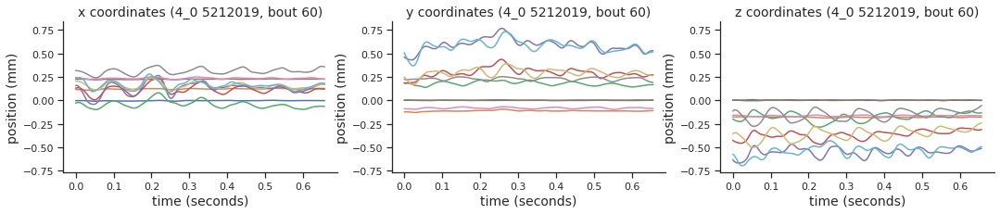

05212019_fly4_0 R2C26  rot-ccw-0.18 sec


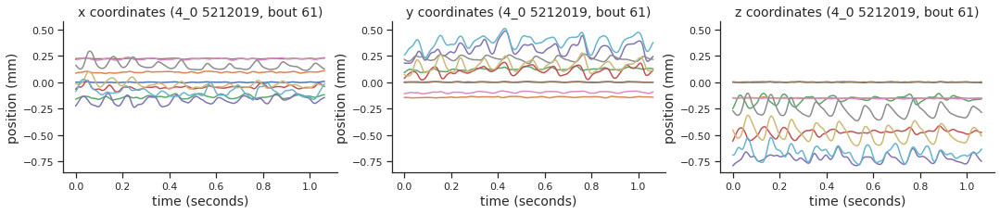

05212019_fly4_0 R2C26  rot-ccw-0.18 sec


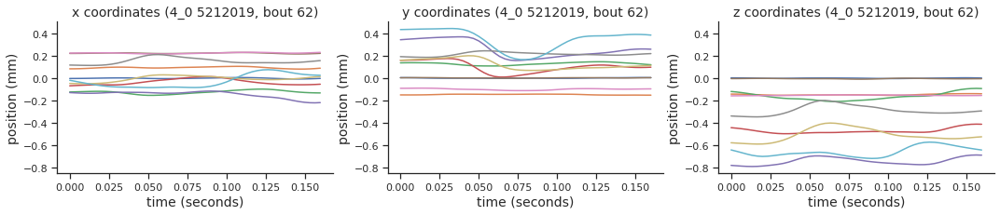

05212019_fly4_0 R3C23  rot-ccw-0.03 sec


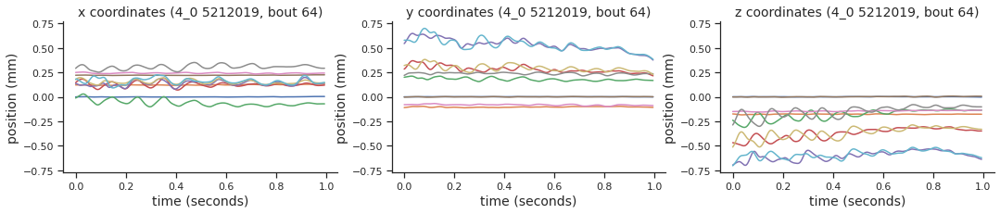

05212019_fly4_0 R3C24  rot-ccw-0.06 sec


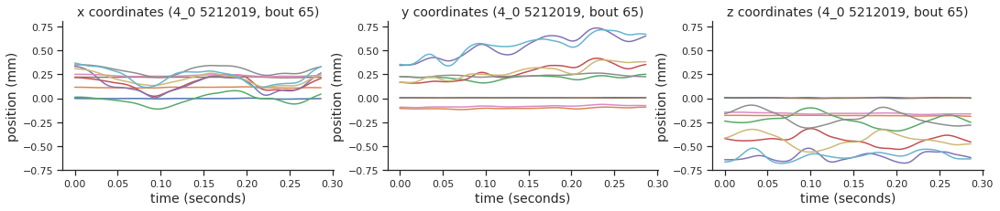

05222019_fly1_0 R1C3  str-cw-0.06 sec


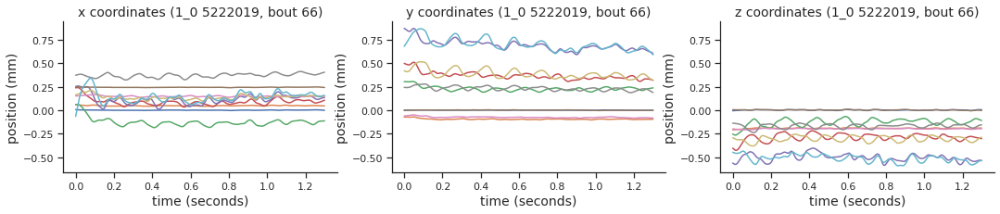

05222019_fly1_0 R2C17  rot-cw-0.06 sec


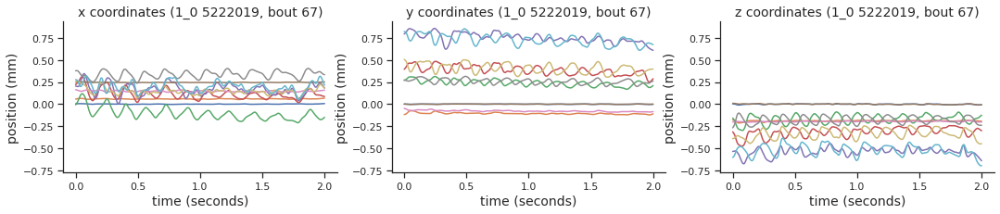

05222019_fly1_0 R3C8  str-ccw-0 sec


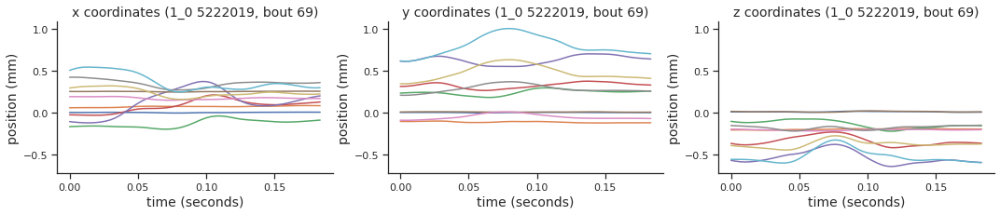

05222019_fly1_0 R3C25  rot-ccw-0.09 sec


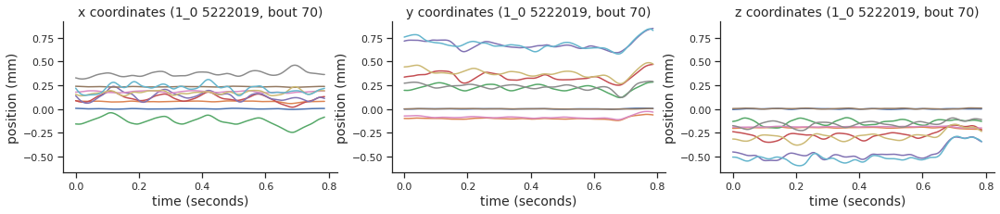

05222019_fly3_0 R1C27  rot-ccw-0.36 sec


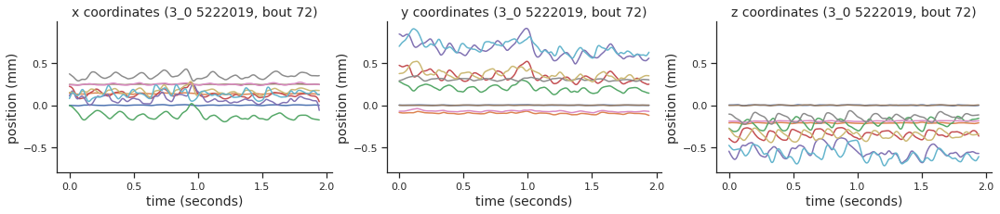

05222019_fly3_0 R2C1  str-cw-0 sec


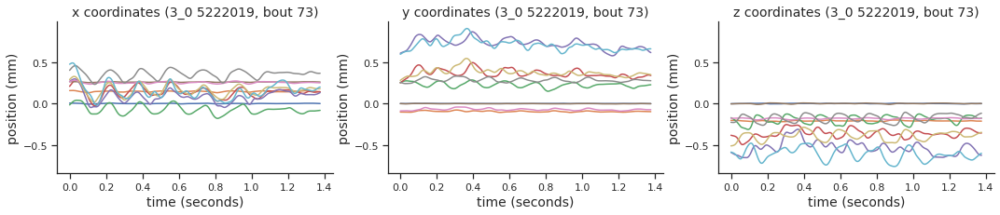

05222019_fly3_0 R2C24  rot-ccw-0.06 sec


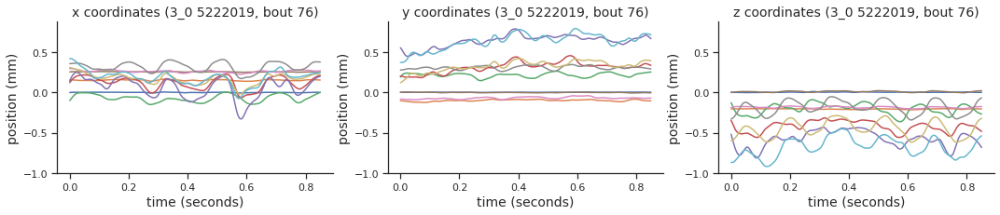

05222019_fly3_0 R2C27  rot-ccw-0.36 sec


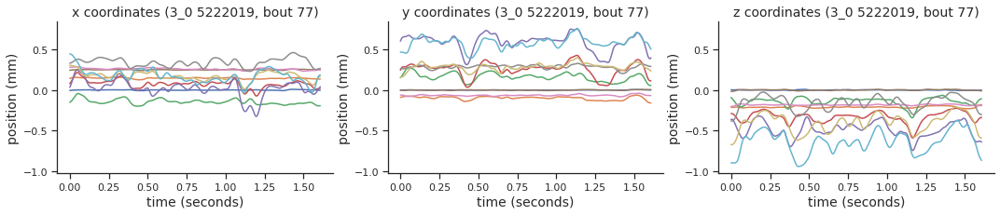

05222019_fly3_0 R3C2  str-cw-0.03 sec


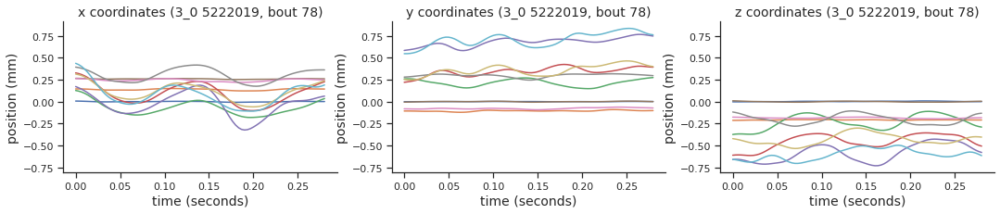

05222019_fly3_0 R3C2  str-cw-0.03 sec


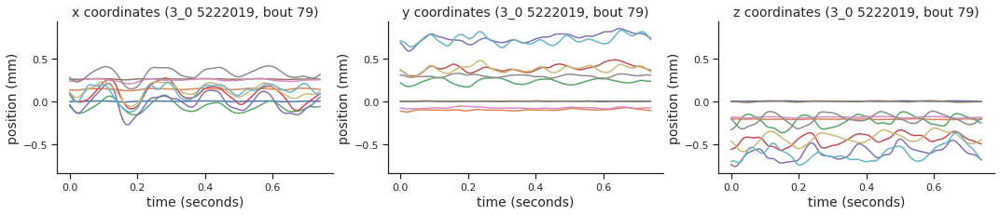

05222019_fly3_0 R3C5  str-cw-0.18 sec


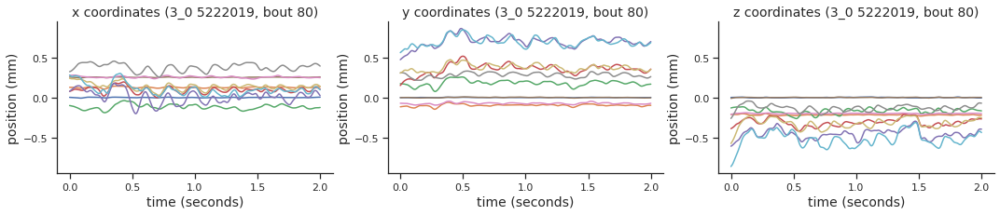

05222019_fly3_0 R3C6  str-cw-0.36 sec


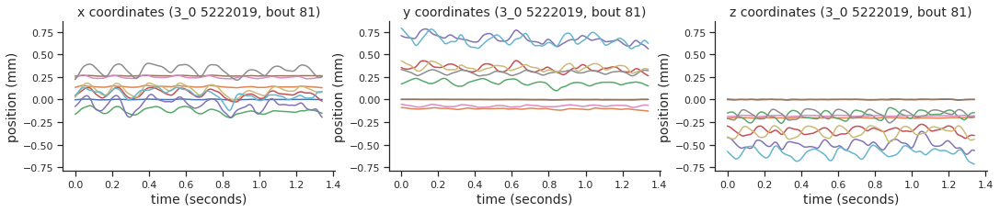

05222019_fly3_0 R3C13  str-ccw-0.36 sec


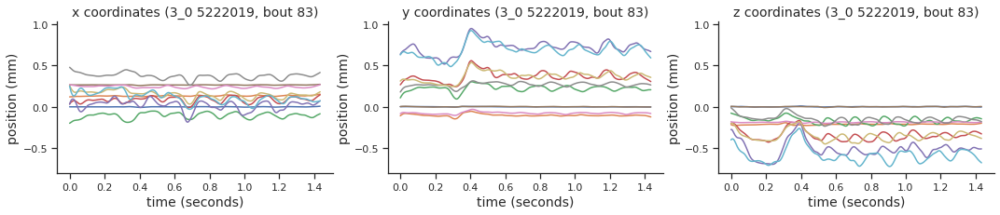

05222019_fly3_0 R3C16  rot-cw-0.03 sec


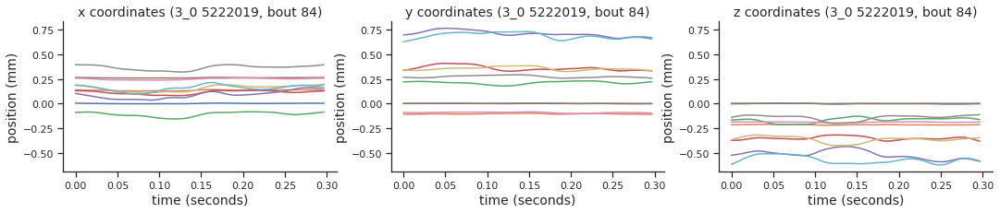

05222019_fly3_0 R3C19  rot-cw-0.18 sec


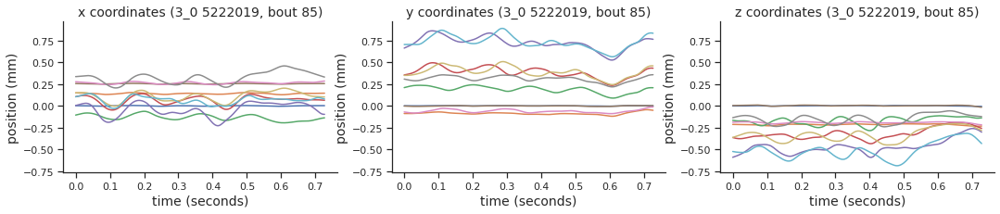

05222019_fly4_0 R2C6  str-cw-0.36 sec


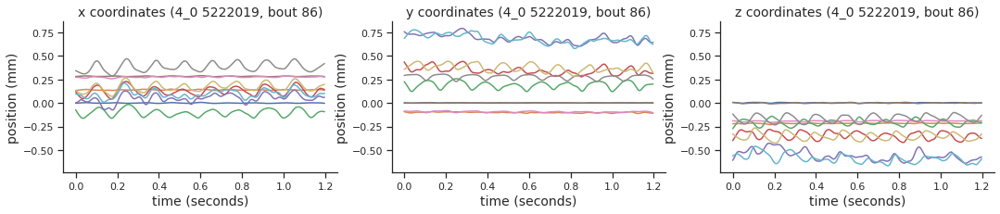

05222019_fly4_0 R2C8  str-ccw-0 sec


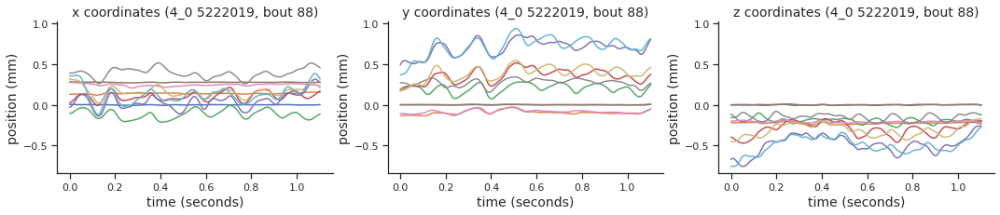

05222019_fly4_0 R2C26  rot-ccw-0.18 sec


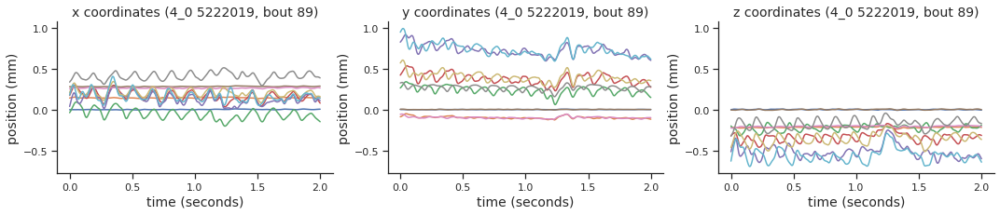

05222019_fly4_0 R2C28  rot-ccw-0.72 sec


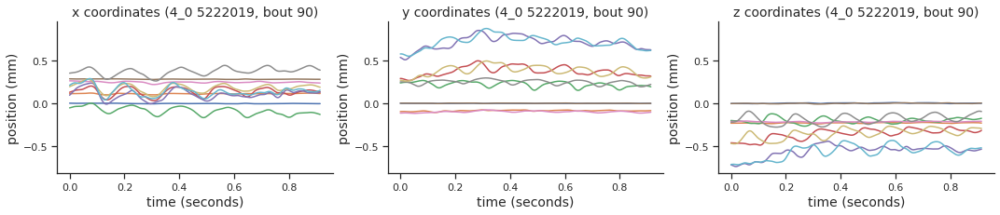

05222019_fly4_0 R3C17  rot-cw-0.06 sec


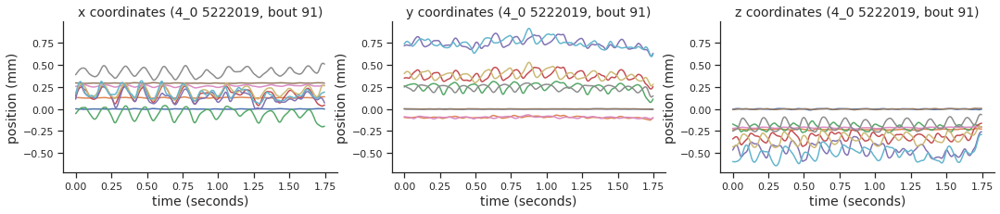

05222019_fly5_0 R1C12  str-ccw-0.18 sec


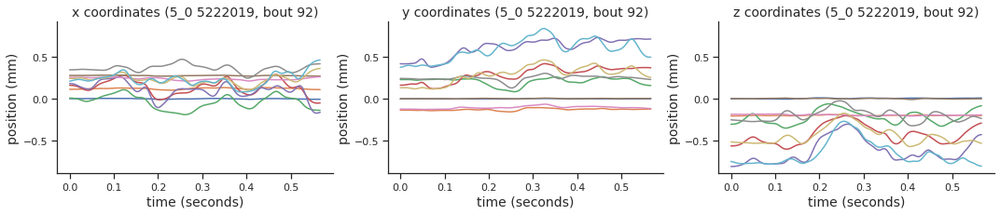

05222019_fly5_0 R1C12  str-ccw-0.18 sec


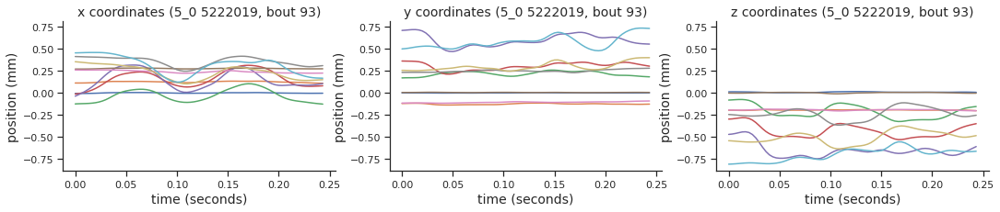

05222019_fly5_0 R1C15  rot-cw-0 sec


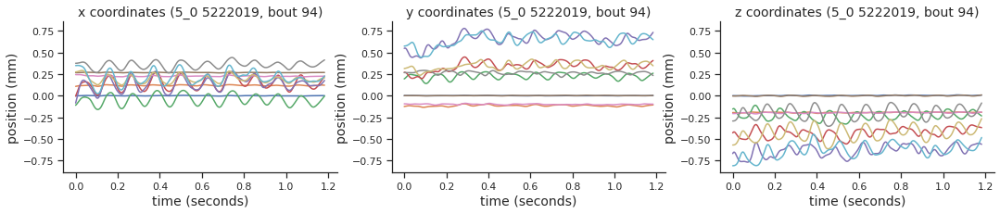

05222019_fly5_0 R2C13  str-ccw-0.36 sec


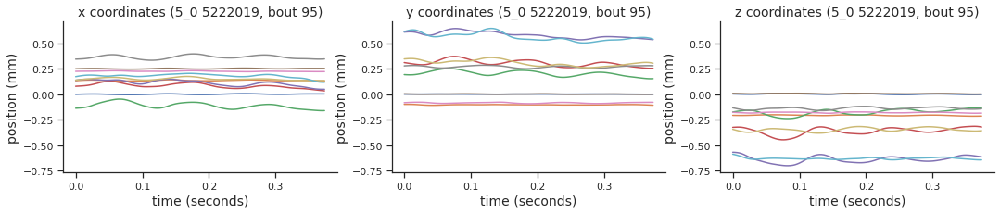

05242019_fly1_0 R1C3  str-cw-0.06 sec


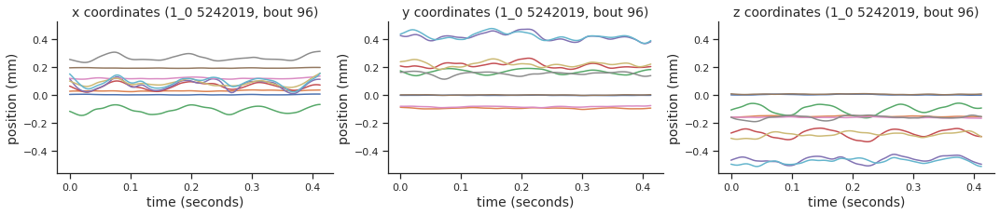

05242019_fly1_0 R1C17  rot-cw-0.06 sec


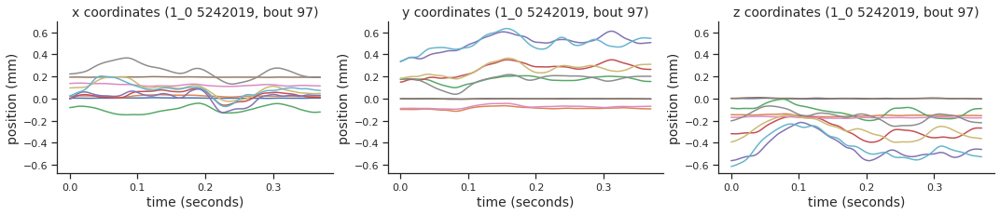

05242019_fly1_0 R2C2  str-cw-0.03 sec


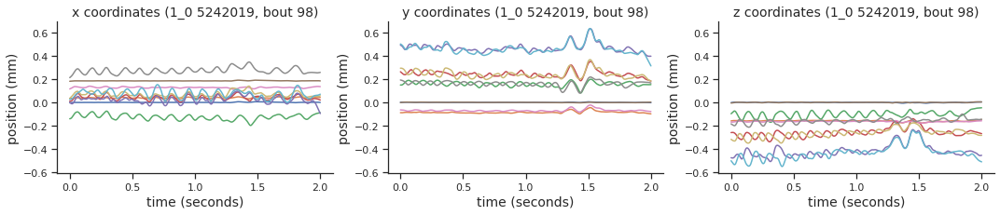

05242019_fly1_0 R2C4  str-cw-0.09 sec


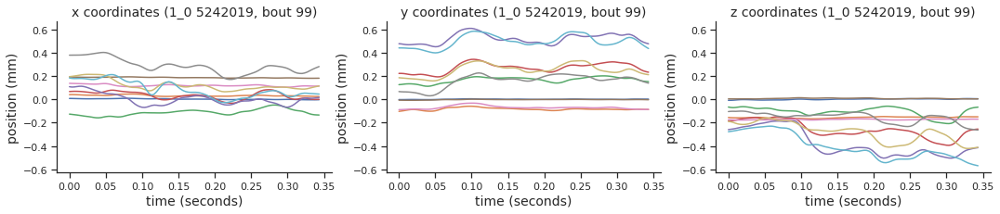

05242019_fly1_0 R3C3  str-cw-0.06 sec


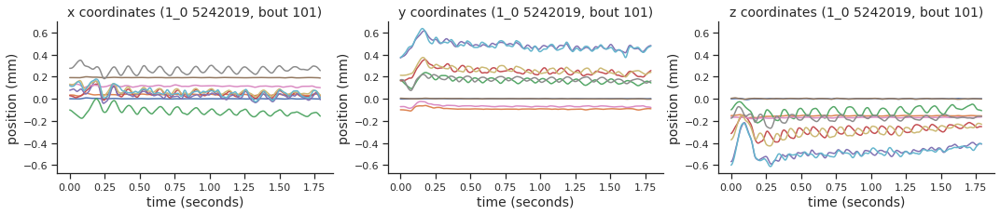

05242019_fly1_0 R3C17  rot-cw-0.06 sec


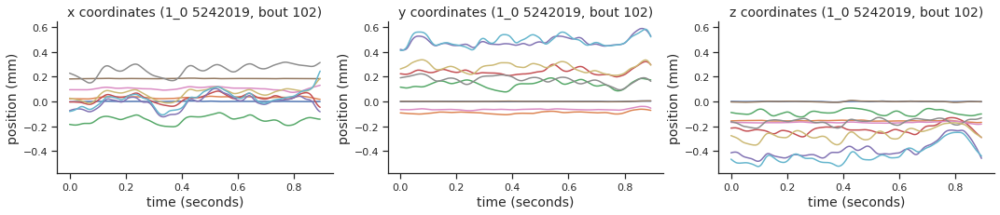

05242019_fly1_0 R3C17  rot-cw-0.06 sec


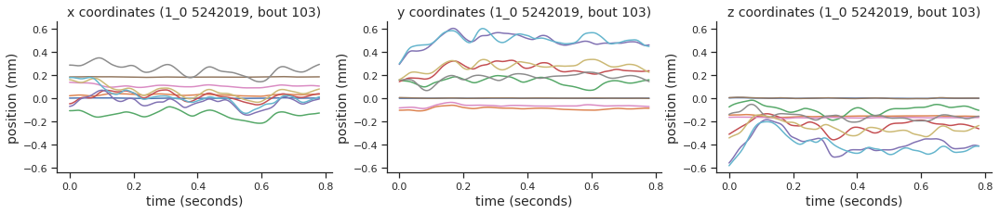

05272019_fly1_0 R1C11  str-ccw-0.09 sec


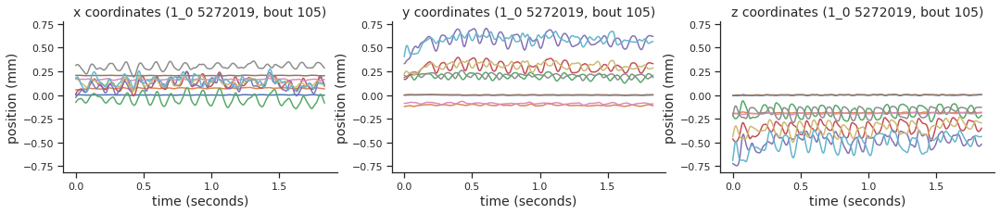

05272019_fly1_0 R2C21  rot-cw-0.72 sec


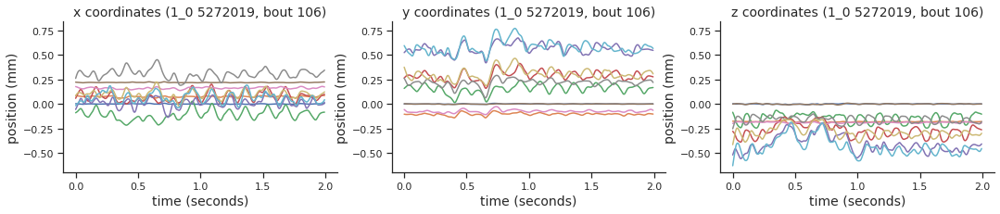

05272019_fly2_0 R1C3  str-cw-0.06 sec


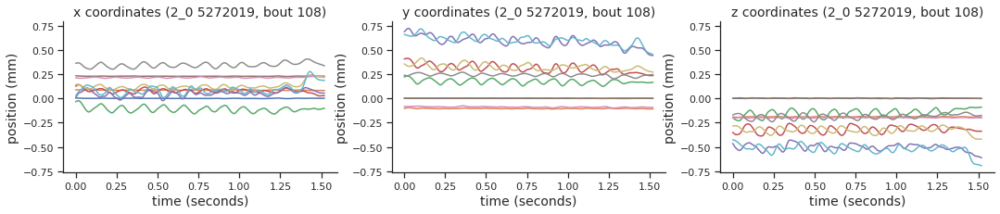

05272019_fly2_0 R1C12  str-ccw-0.18 sec


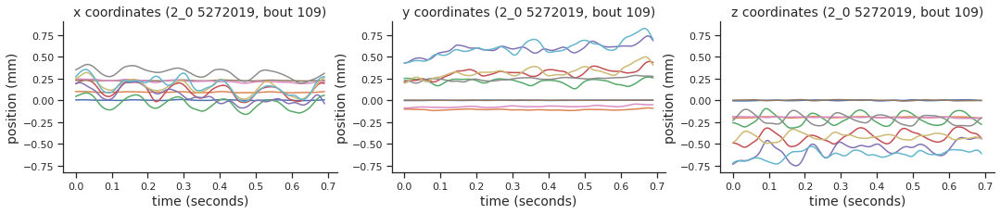

05272019_fly2_0 R1C12  str-ccw-0.18 sec


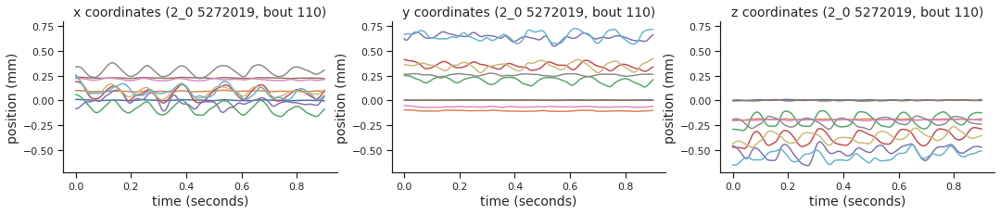

05272019_fly2_0 R1C14  str-ccw-0.72 sec


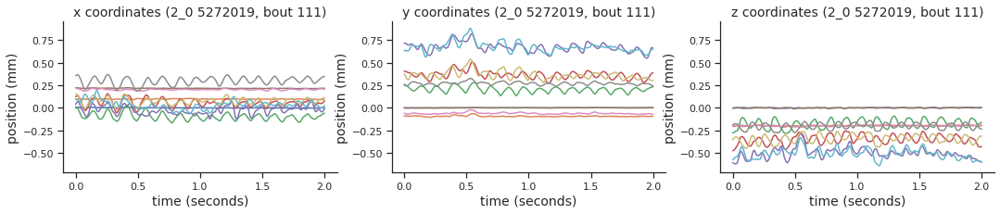

05272019_fly2_0 R2C7  str-cw-0.72 sec


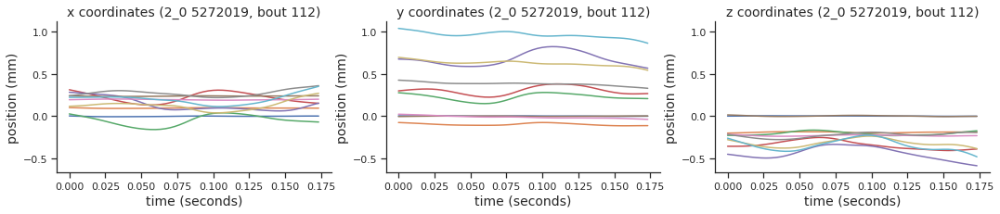

05272019_fly2_0 R3C19  rot-cw-0.18 sec


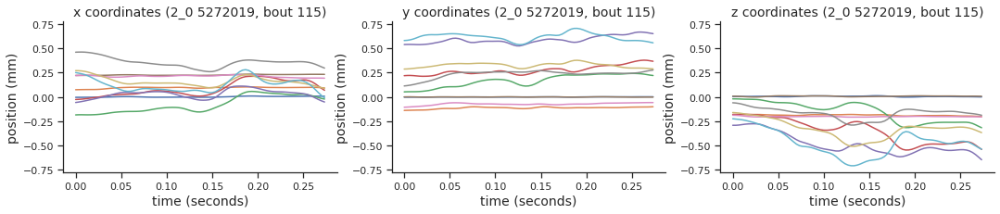

05272019_fly2_0 R3C28  rot-ccw-0.72 sec


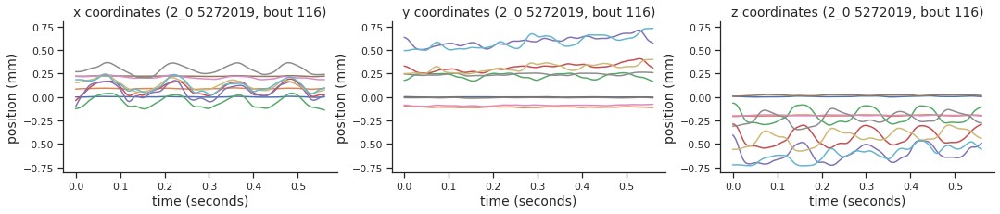

05272019_fly3_0 R1C7  str-cw-0.72 sec


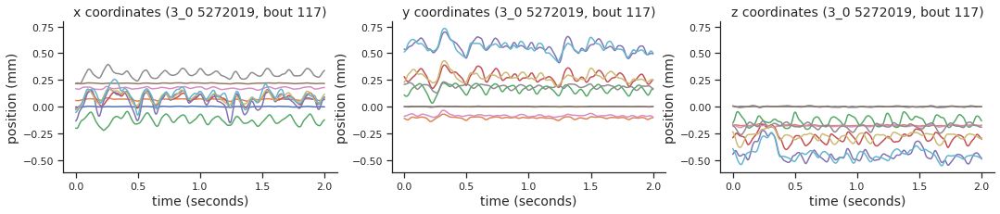

05272019_fly3_0 R1C14  str-ccw-0.72 sec


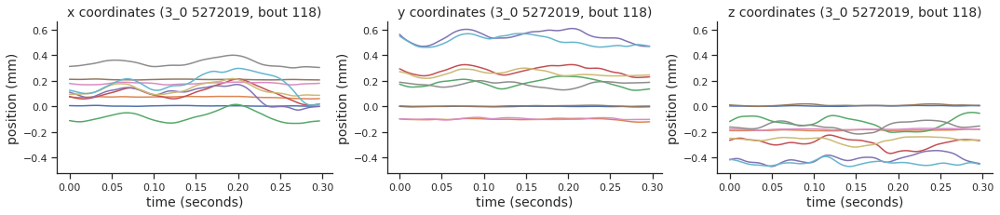

05272019_fly3_0 R1C25  rot-ccw-0.09 sec


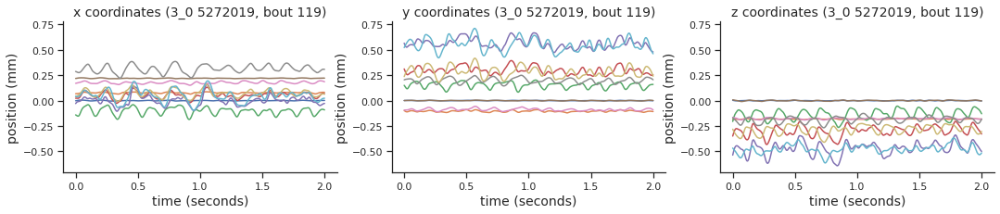

05272019_fly3_0 R2C14  str-ccw-0.72 sec


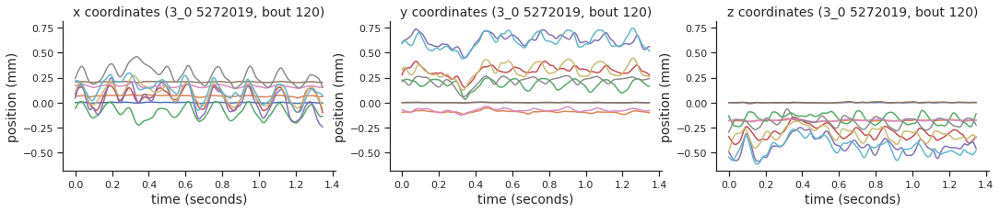

05272019_fly3_0 R2C16  rot-cw-0.03 sec


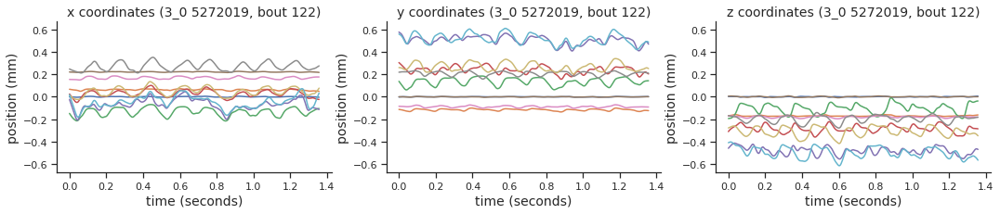

05272019_fly3_0 R2C28  rot-ccw-0.72 sec


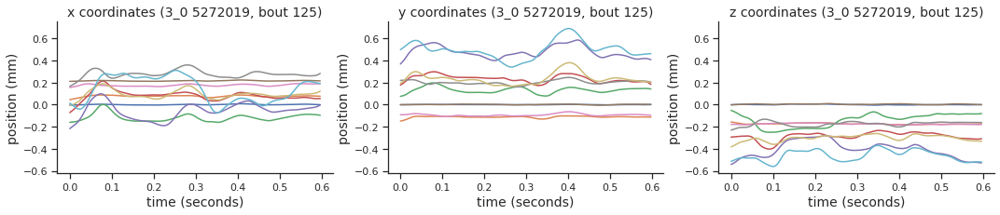

05272019_fly3_0 R3C10  str-ccw-0.06 sec


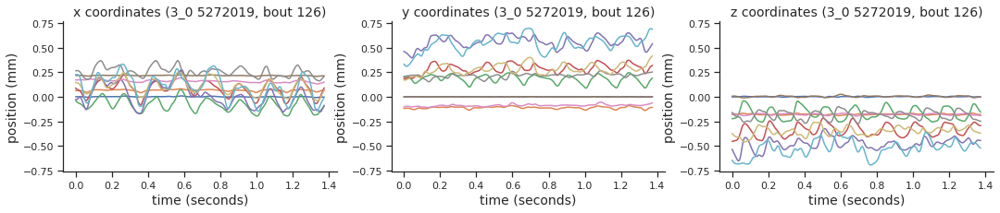

05272019_fly3_0 R3C24  rot-ccw-0.06 sec


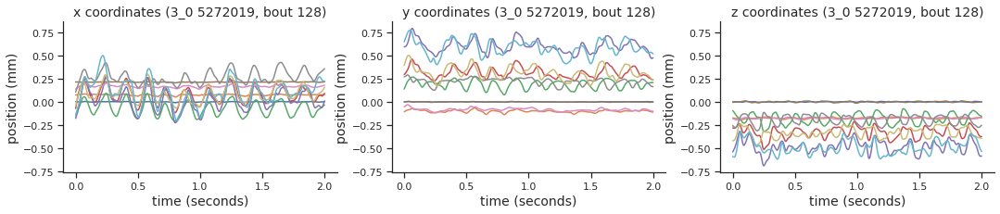

05272019_fly4_0 R1C23  rot-ccw-0.03 sec


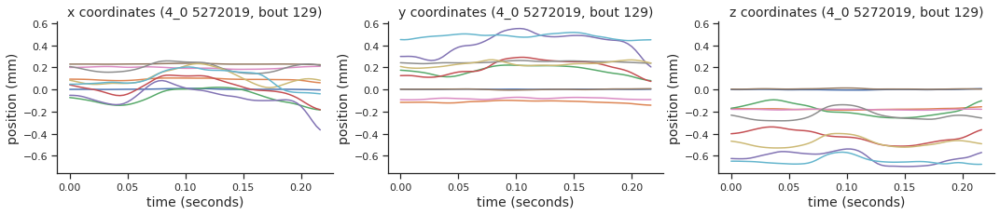

05272019_fly4_0 R3C11  str-ccw-0.09 sec


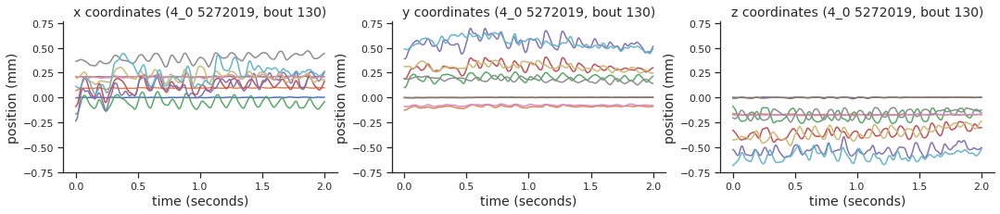

05272019_fly4_0 R3C15  rot-cw-0 sec


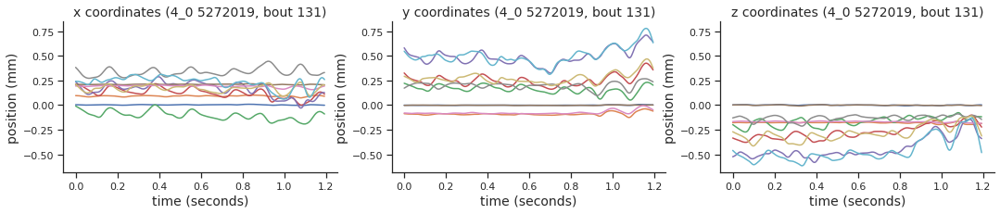

05272019_fly5_0 R2C2  str-cw-0.03 sec


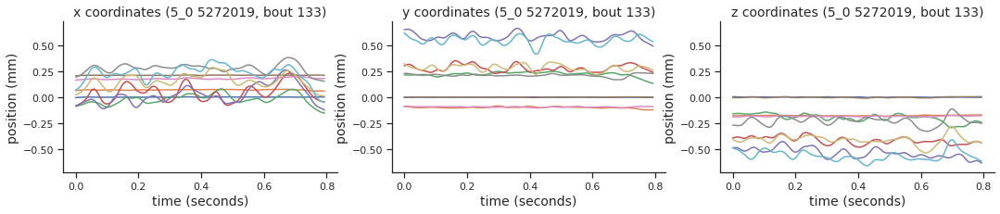

05272019_fly5_0 R2C2  str-cw-0.03 sec


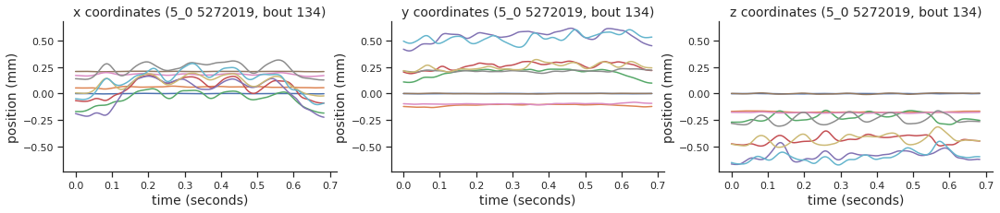

05272019_fly5_0 R2C2  str-cw-0.03 sec


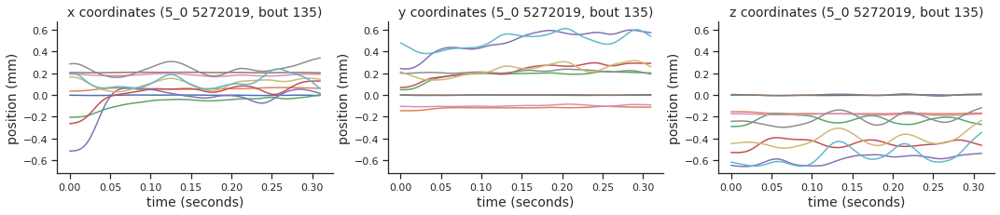

05272019_fly5_0 R2C4  str-cw-0.09 sec


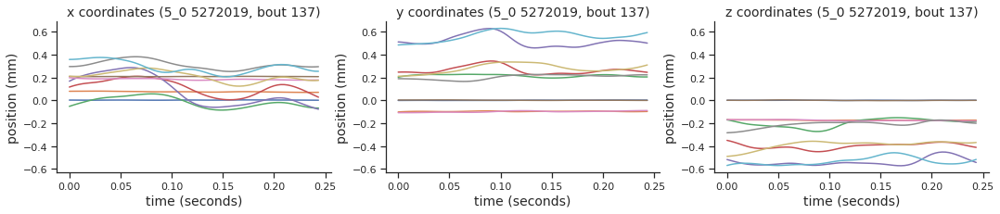

05272019_fly5_0 R2C4  str-cw-0.09 sec


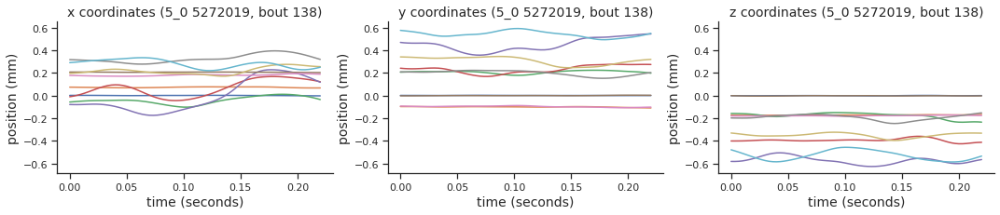

05272019_fly5_0 R2C7  str-cw-0.72 sec


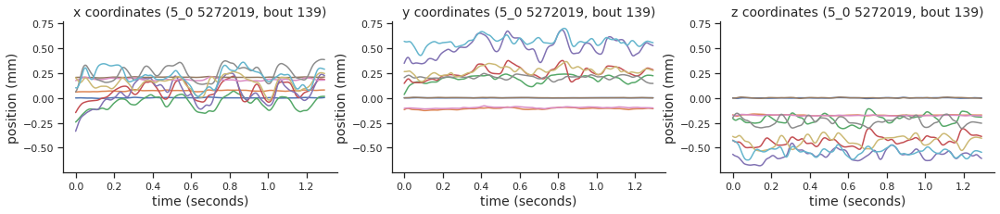

05272019_fly5_0 R2C10  str-ccw-0.06 sec


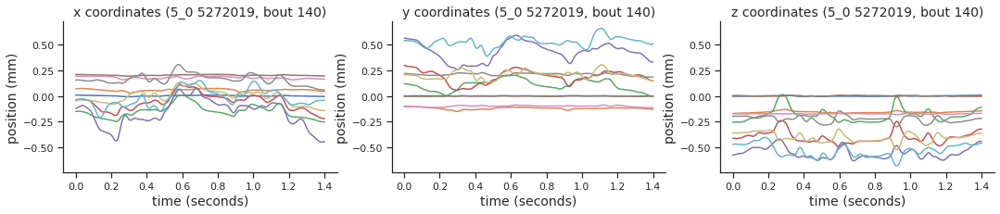

05272019_fly5_0 R3C1  str-cw-0 sec


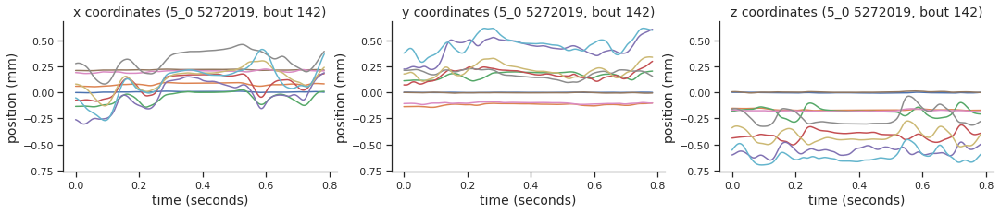

05272019_fly5_0 R3C2  str-cw-0.03 sec


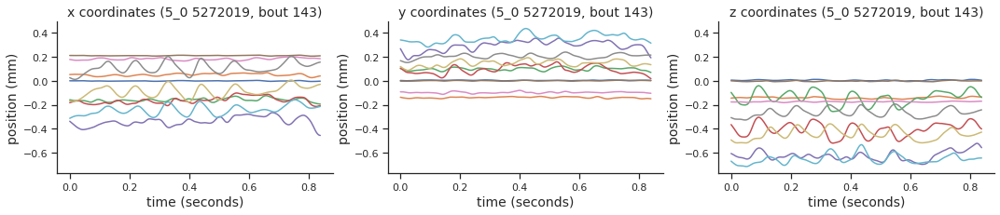

05272019_fly5_0 R3C2  str-cw-0.03 sec


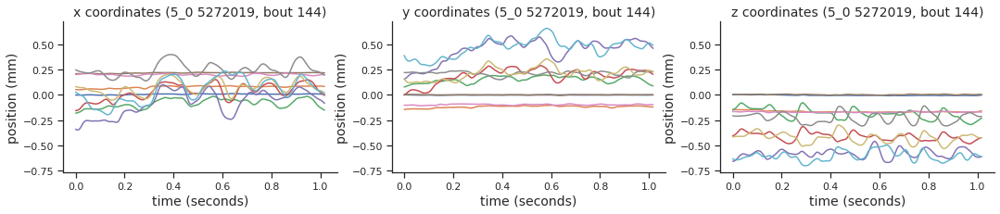

05272019_fly5_0 R3C18  rot-cw-0.09 sec


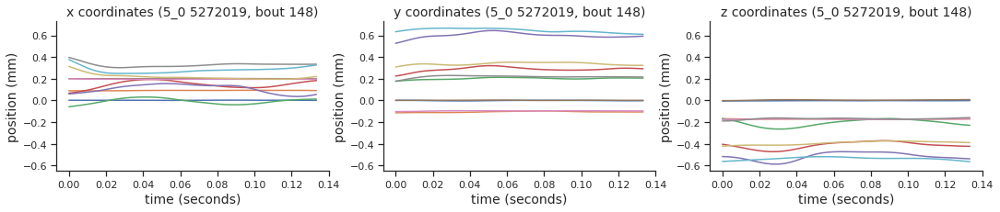

05272019_fly5_0 R3C21  rot-cw-0.72 sec


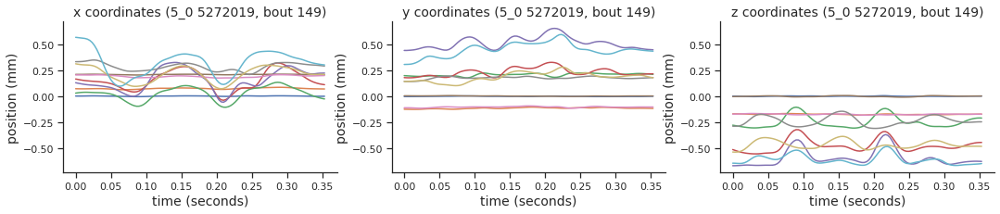

05272019_fly5_0 R3C21  rot-cw-0.72 sec


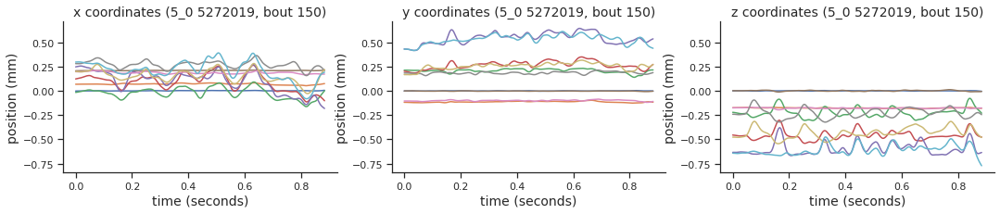

05272019_fly5_0 R3C22  rot-ccw-0 sec


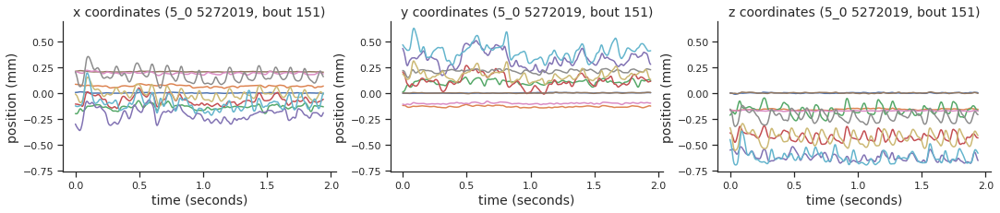

05272019_fly5_0 R3C23  rot-ccw-0.03 sec


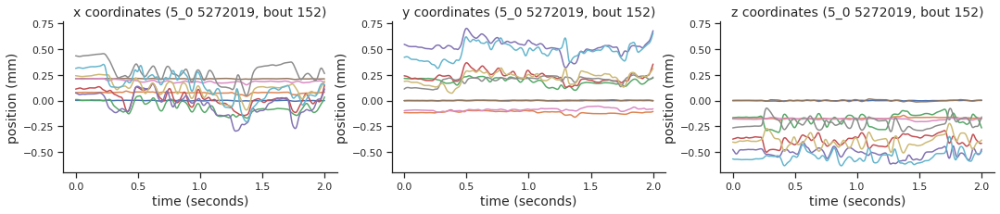

05272019_fly5_0 R3C28  rot-ccw-0.72 sec


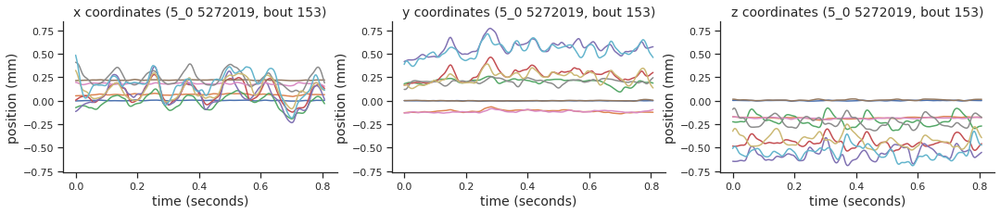

05282019_fly1_0 R2C10  str-ccw-0.06 sec


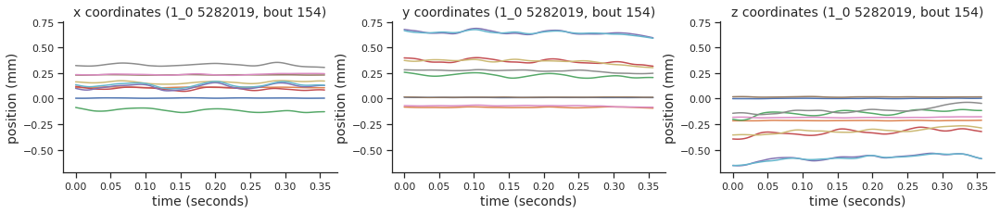

05282019_fly3_0 R2C26  rot-ccw-0.18 sec


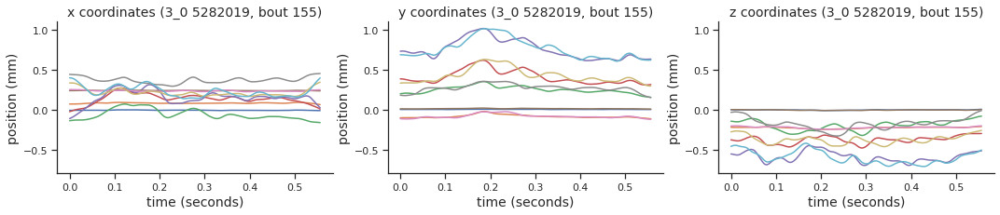

05282019_fly4_0 R1C13  str-ccw-0.36 sec


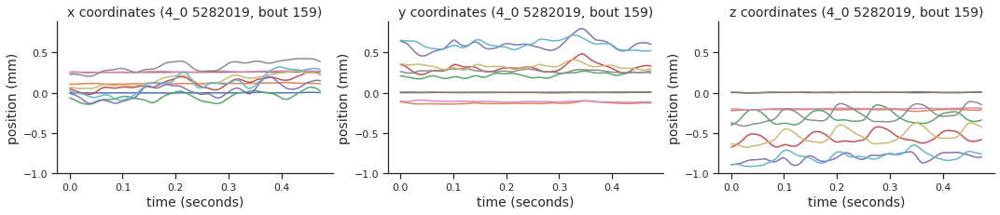

05282019_fly4_0 R2C12  str-ccw-0.18 sec


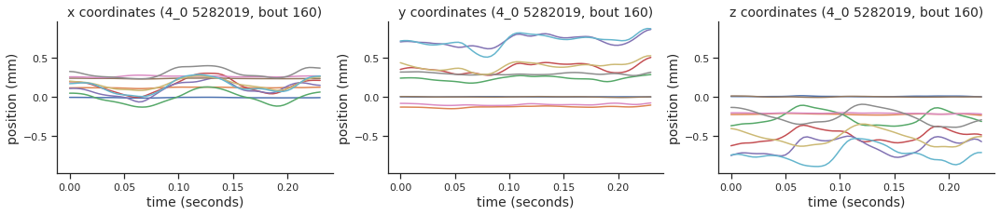

05282019_fly4_0 R2C12  str-ccw-0.18 sec


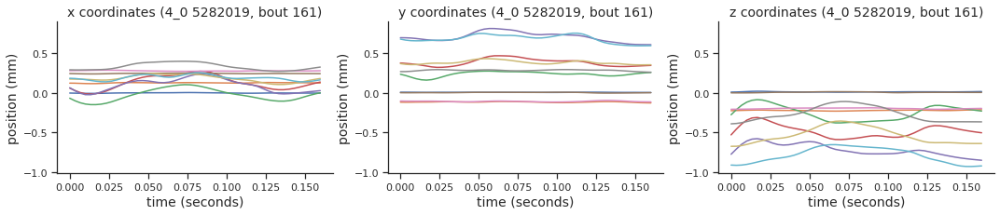

05282019_fly4_0 R3C4  str-cw-0.09 sec


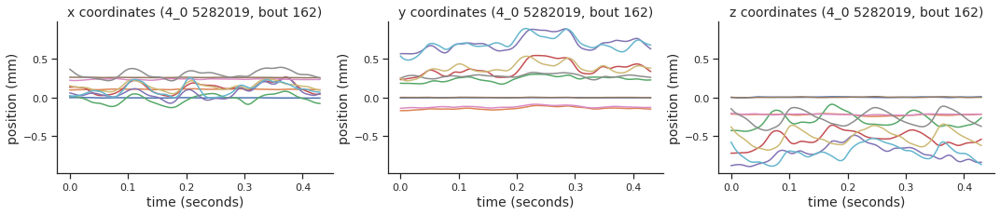

05282019_fly4_0 R3C10  str-ccw-0.06 sec


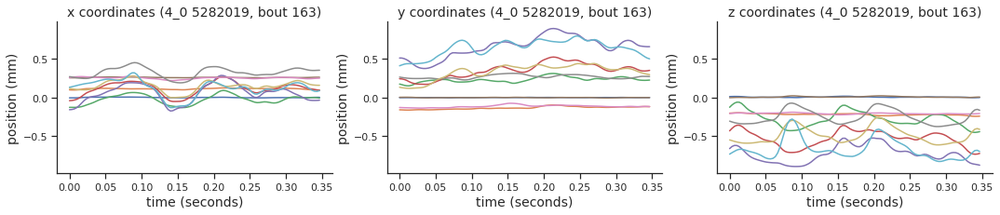

05282019_fly5_0 R2C9  str-ccw-0.03 sec


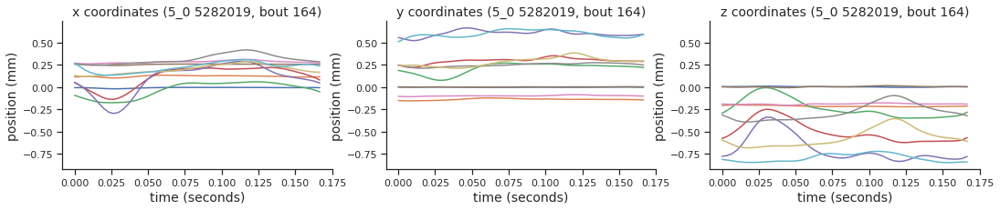

05282019_fly5_0 R3C5  str-cw-0.18 sec


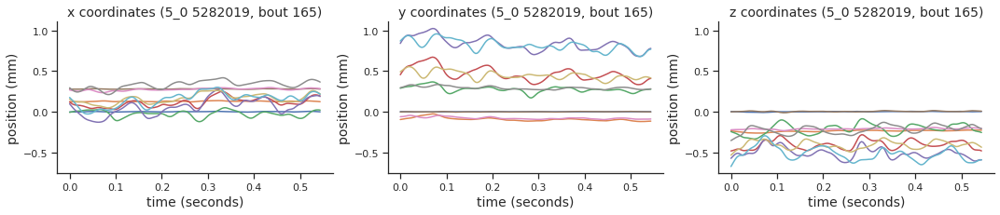

06112019_fly1_0 R3C17  rot-cw-0.06 sec


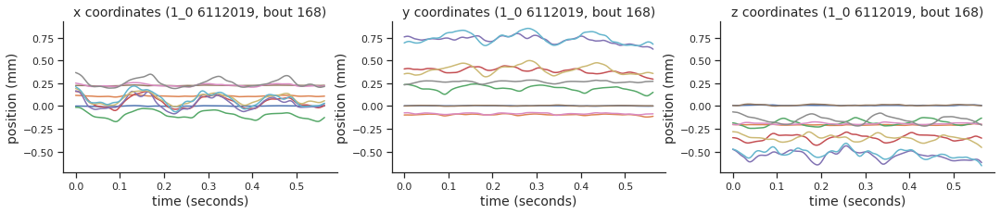

06112019_fly3_0 R2C12  str-ccw-0.18 sec


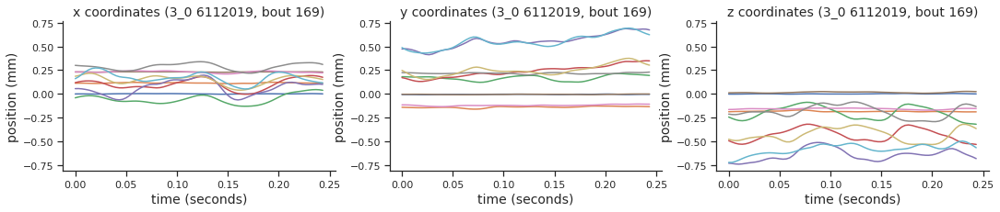

06112019_fly3_0 R3C28  rot-ccw-0.72 sec


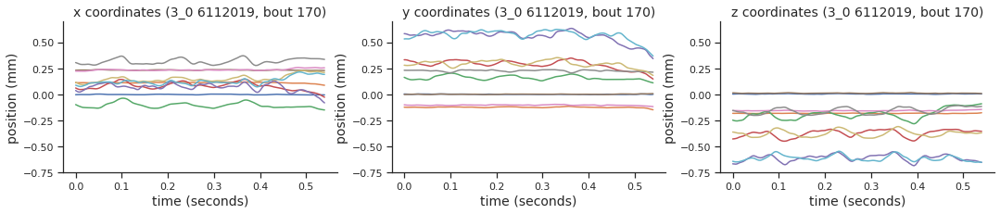

06112019_fly4_0 R1C4  str-cw-0.09 sec


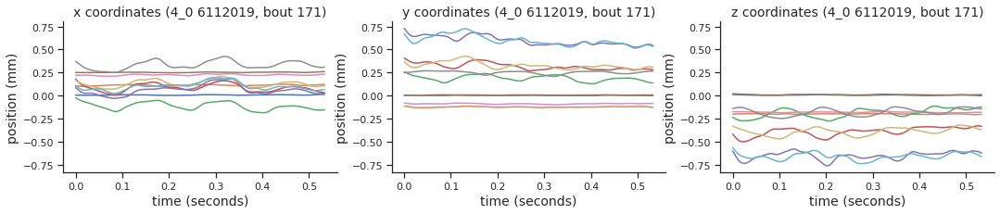

06122019_fly1_0 R2C9  str-ccw-0.03 sec


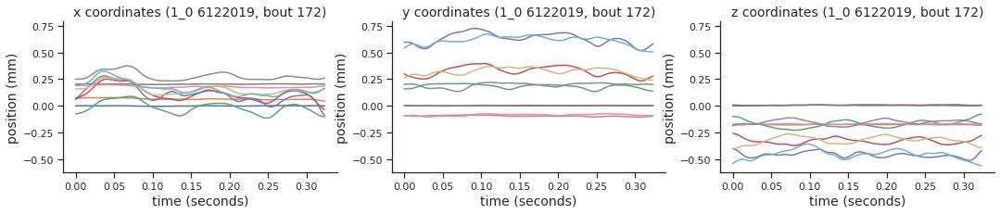

06122019_fly3_0 R1C10  str-ccw-0.06 sec


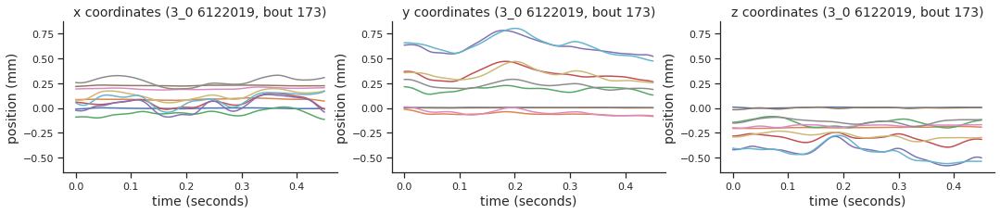

06122019_fly3_0 R3C1  str-cw-0 sec


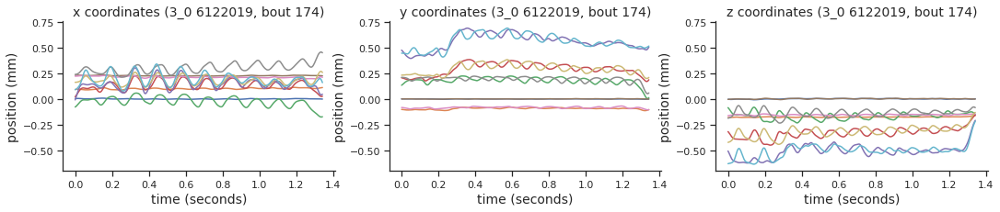

06122019_fly3_0 R3C15  rot-cw-0 sec


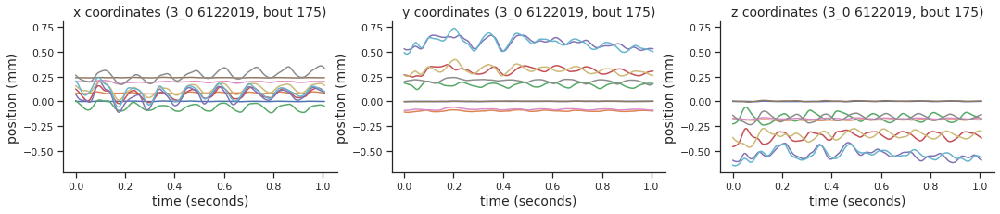

06132019_fly1_0 R1C27  rot-ccw-0.36 sec


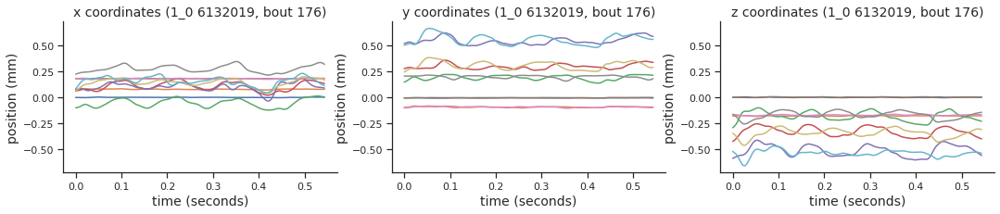

06132019_fly2_0 R1C24  rot-ccw-0.06 sec


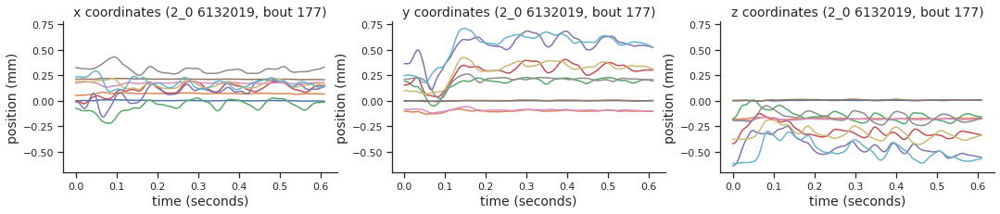

06132019_fly3_0 R1C19  rot-cw-0.18 sec


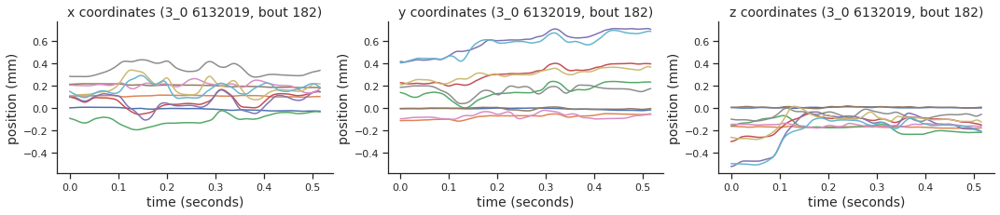

06132019_fly3_0 R1C24  rot-ccw-0.06 sec


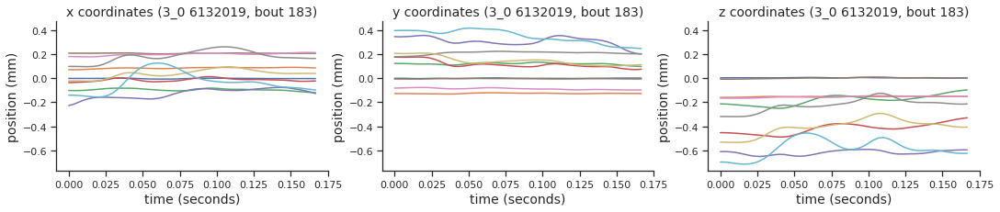

06132019_fly3_0 R2C11  str-ccw-0.09 sec


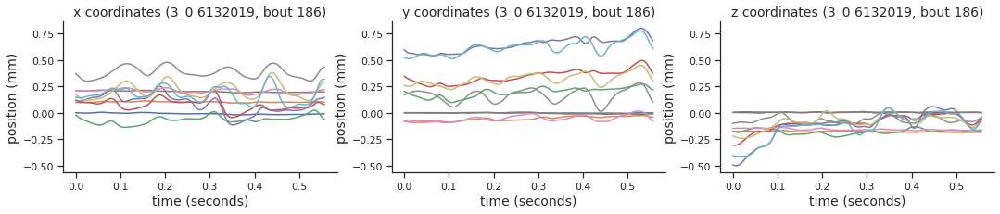

06132019_fly4_0 R2C27  rot-ccw-0.36 sec


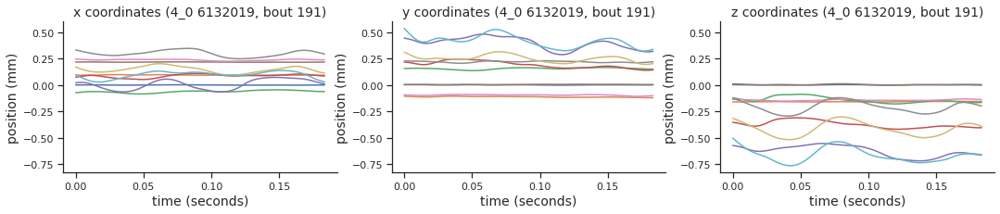

06132019_fly4_0 R3C20  rot-cw-0.36 sec


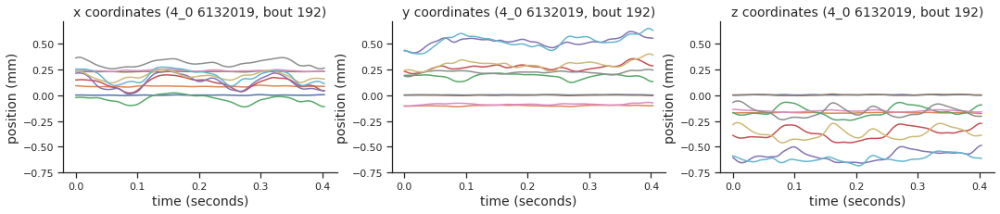

06142019_fly3_0 R2C23  rot-ccw-0.03 sec


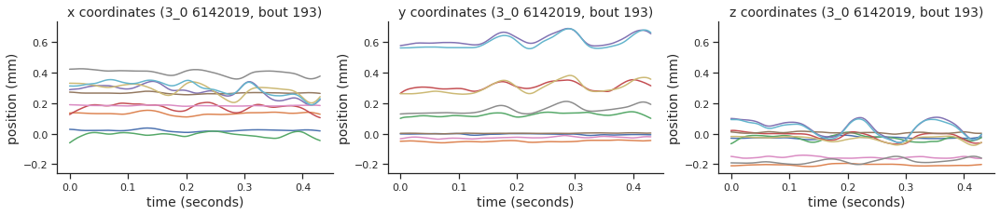

06142019_fly3_0 R2C25  rot-ccw-0.09 sec


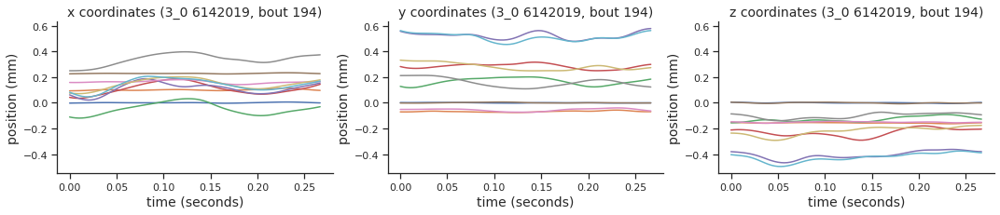

06142019_fly4_0 R2C10  str-ccw-0.06 sec


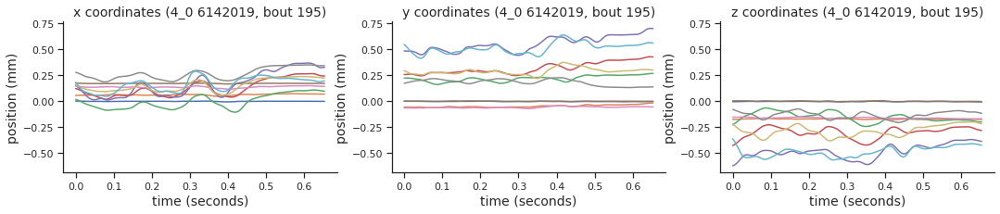

06172019_fly1_0 R3C16  rot-cw-0.03 sec


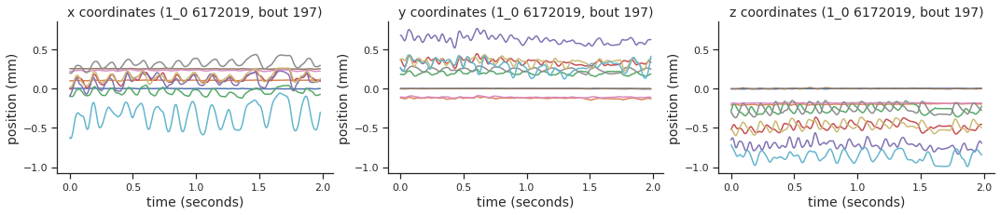

06172019_fly4_0 R1C27  rot-ccw-0.36 sec


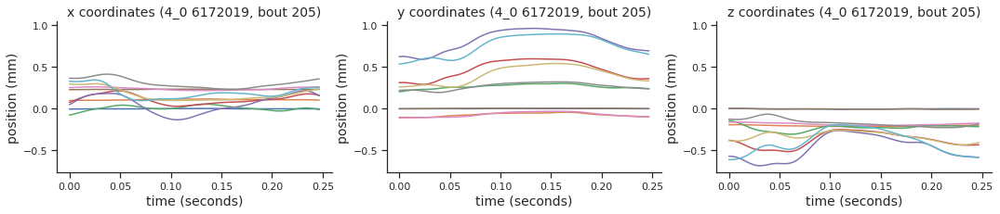

06172019_fly4_0 R1C27  rot-ccw-0.36 sec


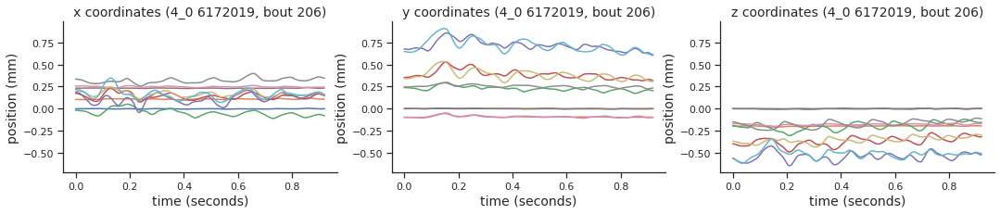

06172019_fly4_0 R2C24  rot-ccw-0.06 sec


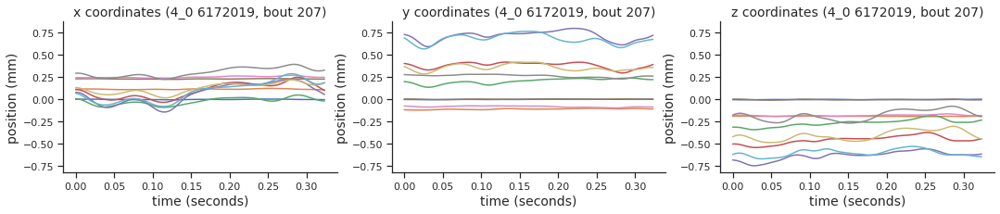

06172019_fly4_0 R2C24  rot-ccw-0.06 sec


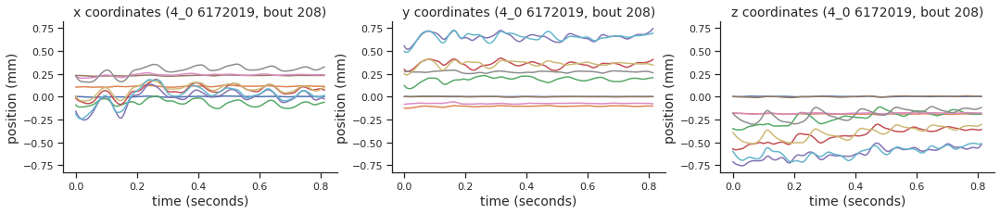

06172019_fly4_0 R3C20  rot-cw-0.36 sec


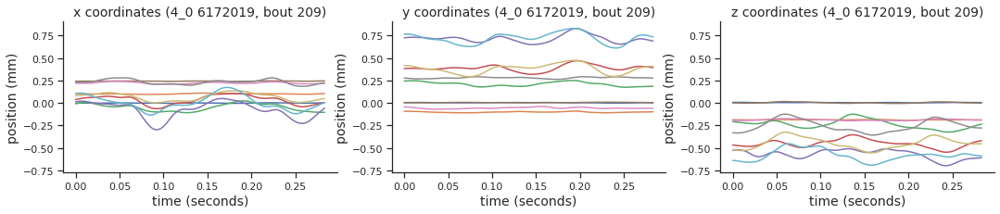

06172019_fly5_0 R2C27  rot-ccw-0.36 sec


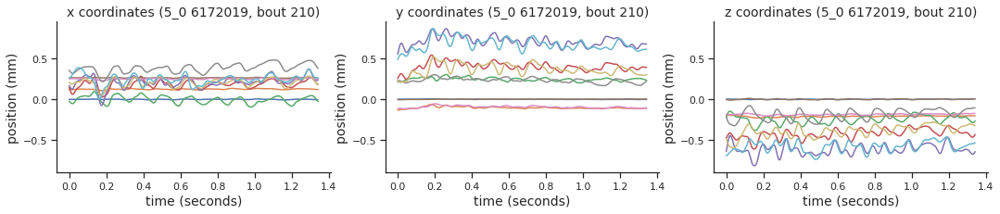

06182019_fly1_0 R1C9  str-ccw-0.03 sec


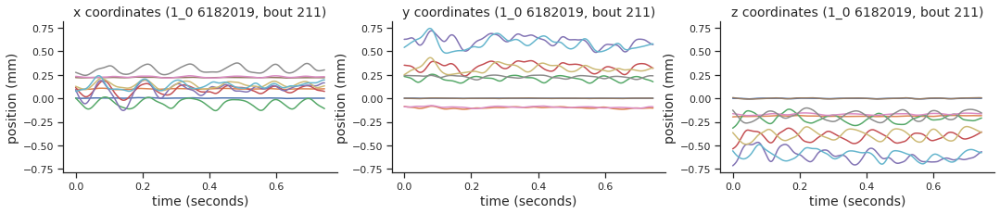

06182019_fly1_0 R2C20  rot-cw-0.36 sec


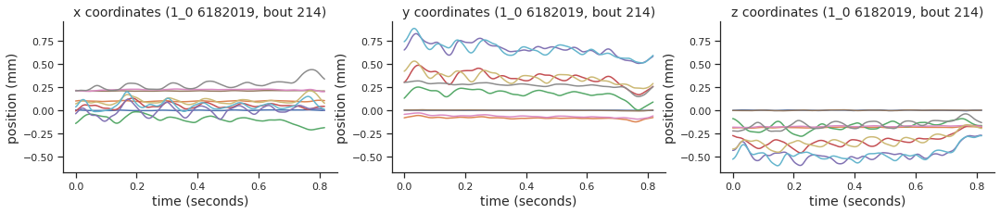

06182019_fly1_0 R2C20  rot-cw-0.36 sec


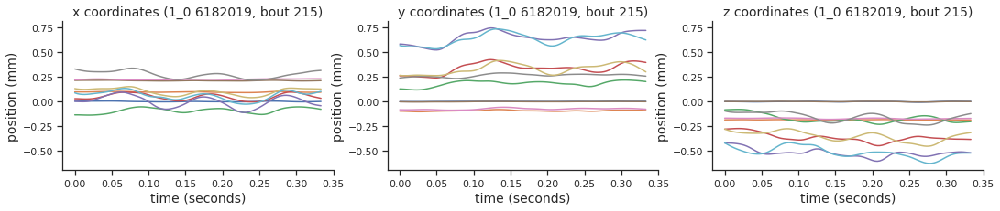

06182019_fly2_0 R1C25  rot-ccw-0.09 sec


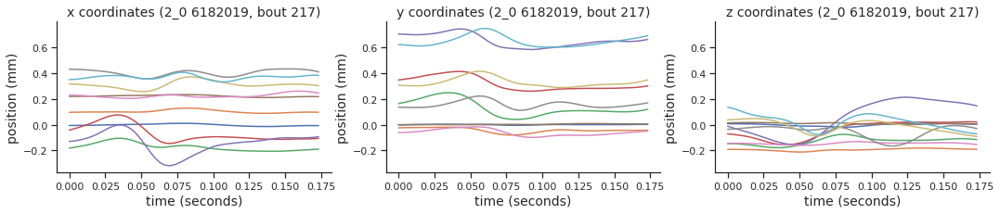

06182019_fly2_0 R1C25  rot-ccw-0.09 sec


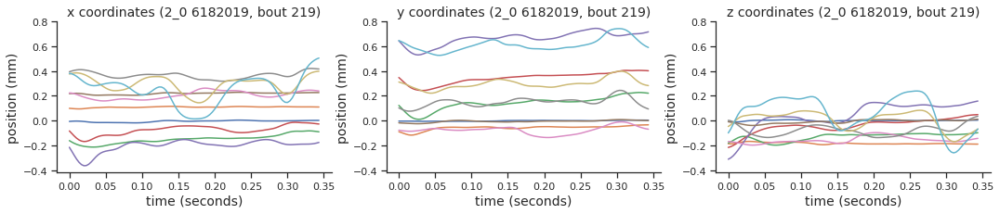

06182019_fly2_0 R1C25  rot-ccw-0.09 sec


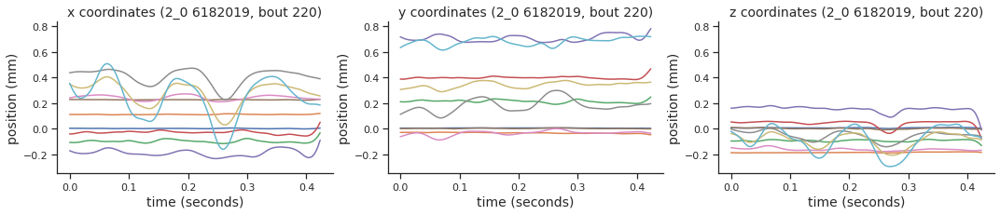

06182019_fly2_0 R1C26  rot-ccw-0.18 sec


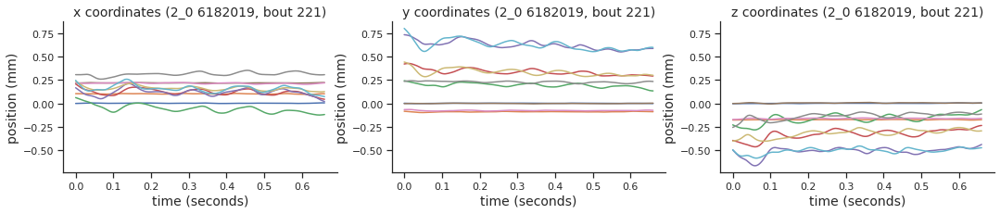

06182019_fly2_0 R3C6  str-cw-0.36 sec


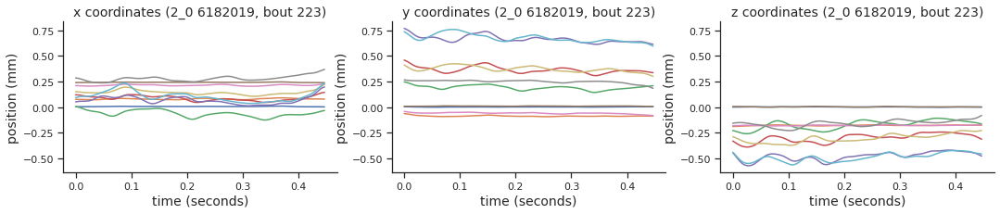

06182019_fly2_0 R3C11  str-ccw-0.09 sec


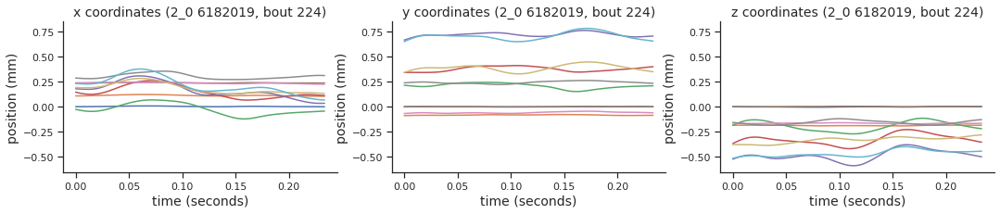

06182019_fly2_0 R3C13  str-ccw-0.36 sec


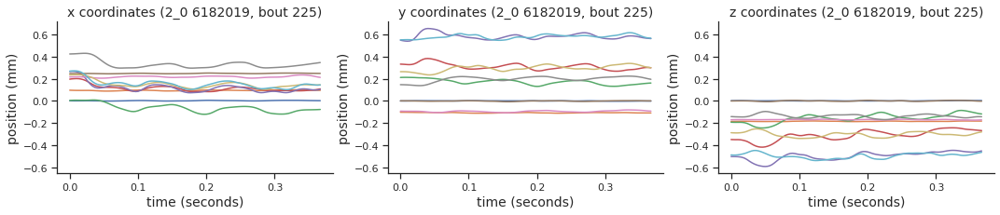

06182019_fly3_0 R1C15  rot-cw-0 sec


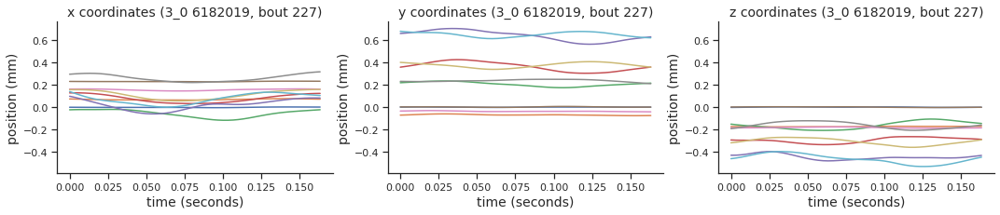

06182019_fly3_0 R3C6  str-cw-0.36 sec


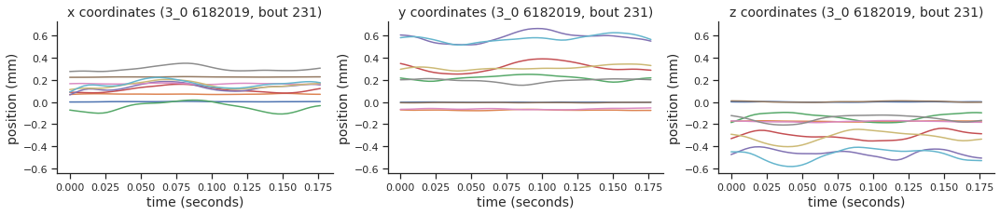

06182019_fly3_0 R3C14  str-ccw-0.72 sec


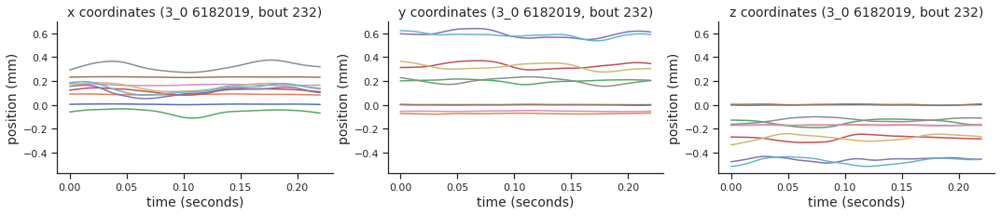

06192019_fly2_0 R3C23  rot-ccw-0.03 sec


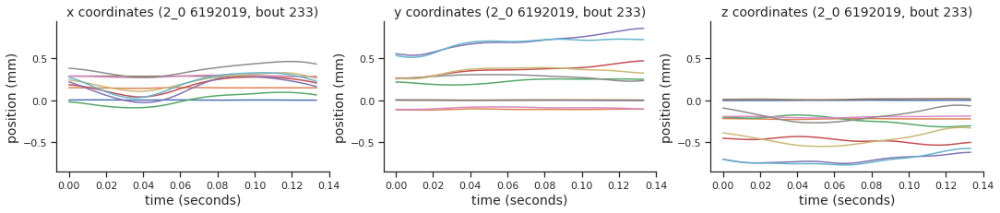

06192019_fly3_0 R1C24  rot-ccw-0.06 sec


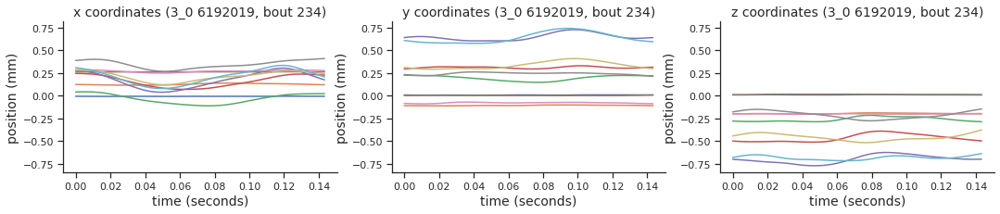

06192019_fly4_0 R1C23  rot-ccw-0.03 sec


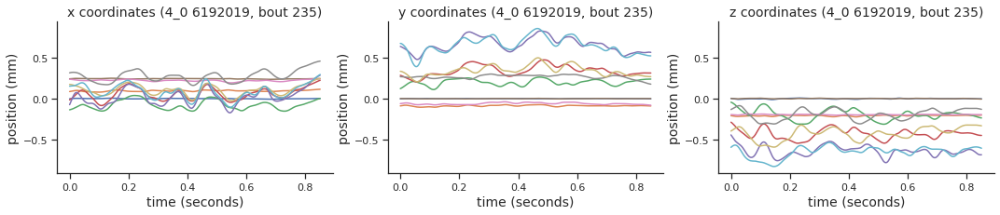

06192019_fly5_0 R2C2  str-cw-0.03 sec


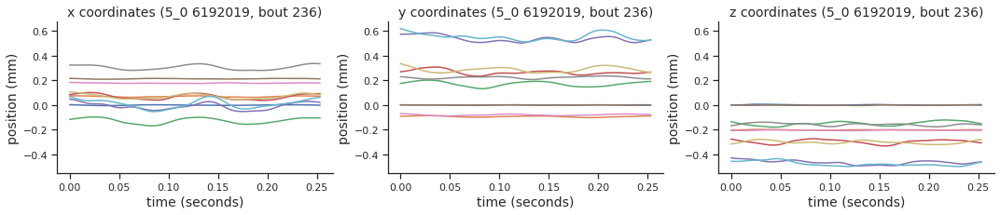

06192019_fly5_0 R2C2  str-cw-0.03 sec


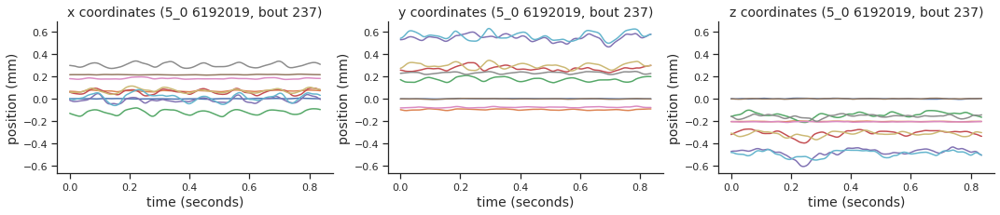

06192019_fly5_0 R3C17  rot-cw-0.06 sec


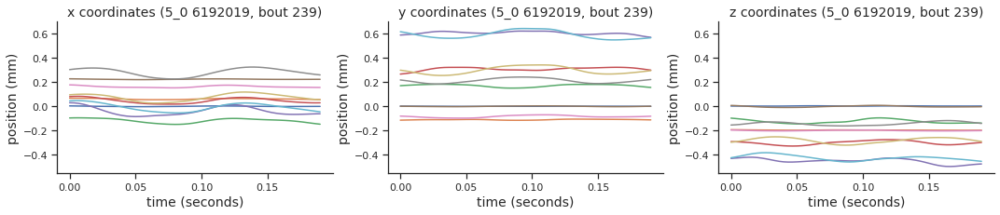

06202019_fly1_0 R3C27  rot-ccw-0.36 sec


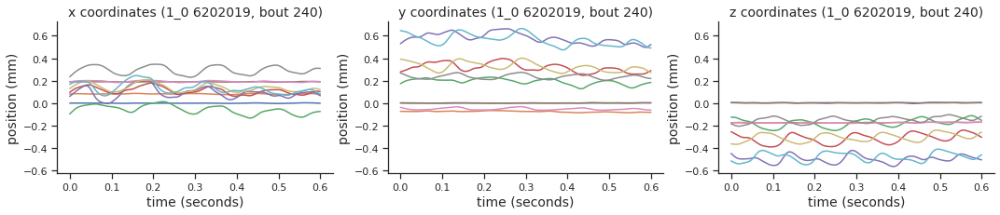

06202019_fly2_0 R2C16  rot-cw-0.03 sec


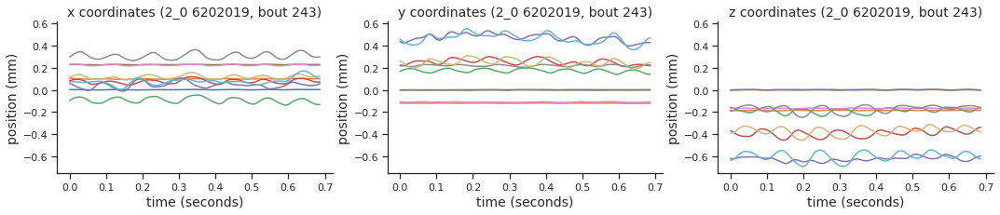

06202019_fly3_0 R1C9  str-ccw-0.03 sec


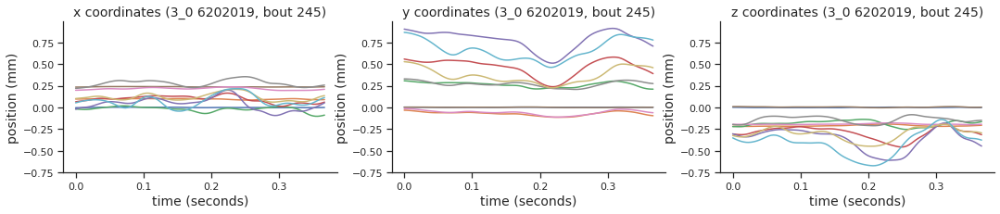

06202019_fly3_0 R1C9  str-ccw-0.03 sec


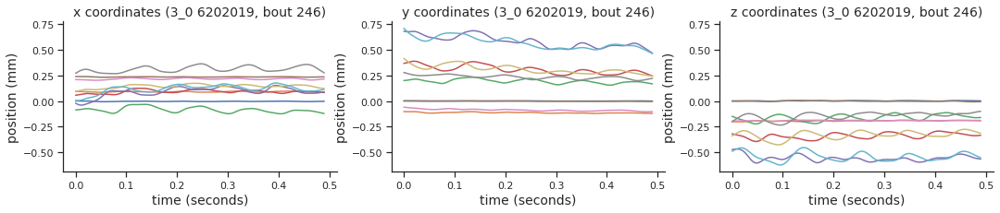

06202019_fly4_0 R3C8  str-ccw-0 sec


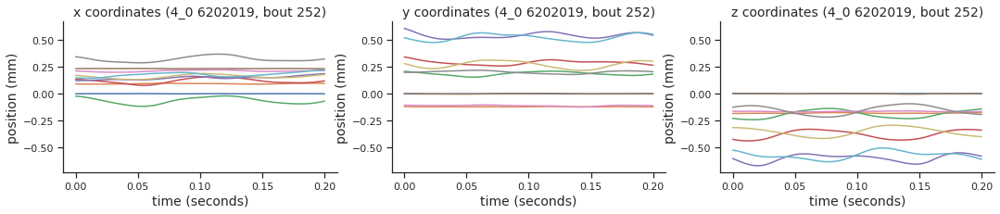

06202019_fly4_0 R3C8  str-ccw-0 sec


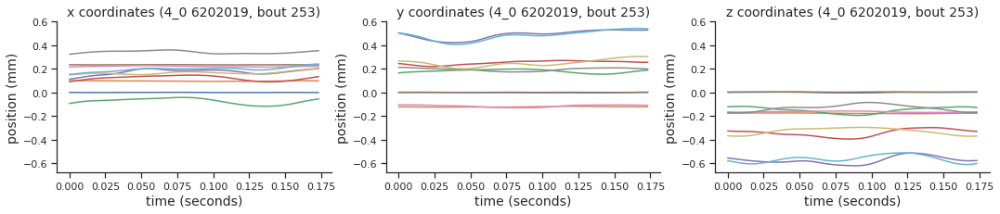

06212019_fly1_0 R3C10  str-ccw-0.06 sec


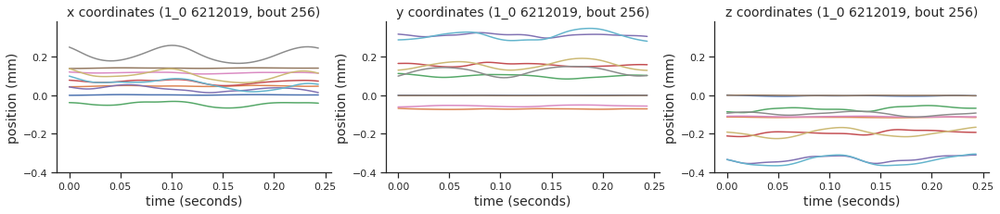

06212019_fly2_0 R2C4  str-cw-0.09 sec


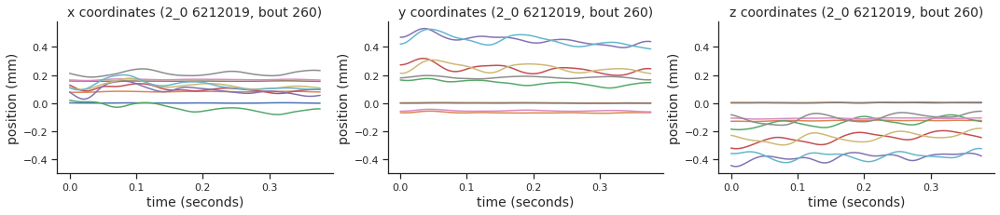

06212019_fly2_0 R2C18  rot-cw-0.09 sec


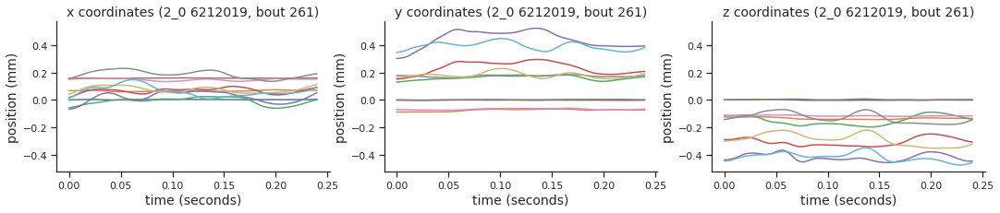

06212019_fly2_0 R3C28  rot-ccw-0.72 sec


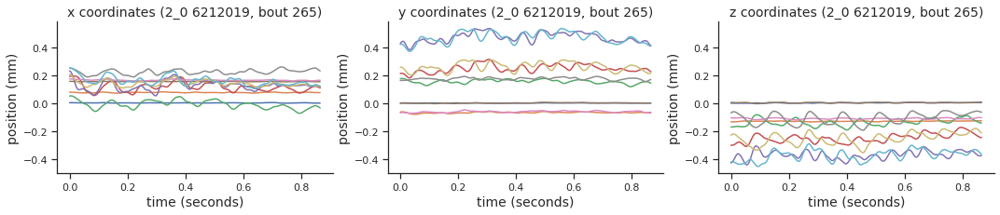

06212019_fly3_0 R1C11  str-ccw-0.09 sec


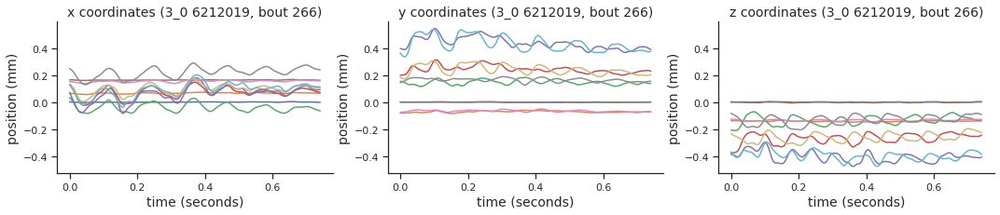

06212019_fly4_0 R1C21  rot-cw-0.72 sec


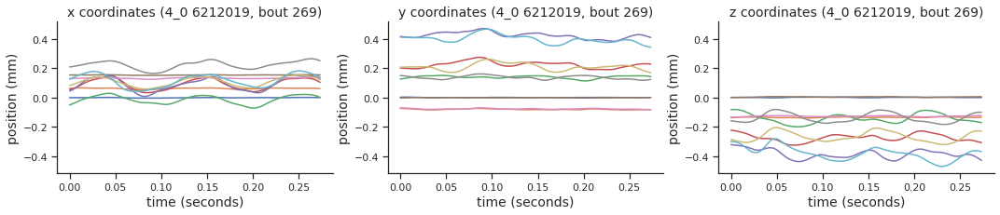

06212019_fly4_0 R2C3  str-cw-0.06 sec


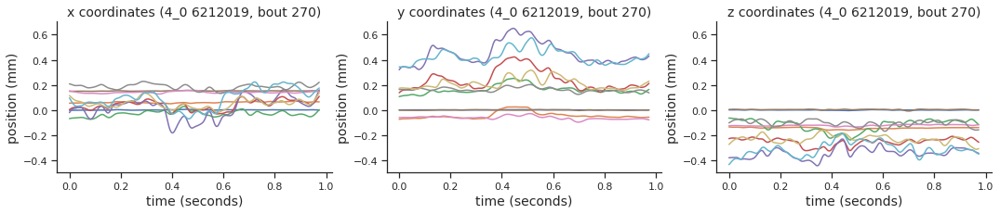

06212019_fly4_0 R3C1  str-cw-0 sec


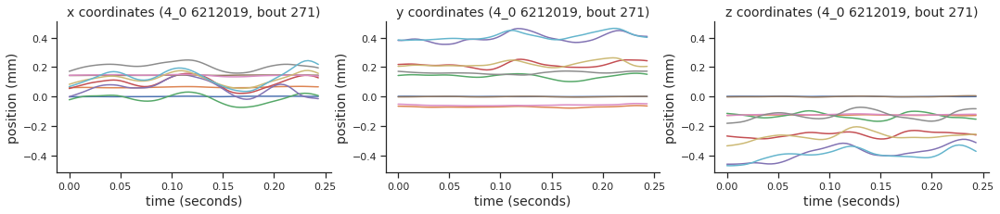

06232019_fly2_0 R3C14  str-ccw-0.72 sec


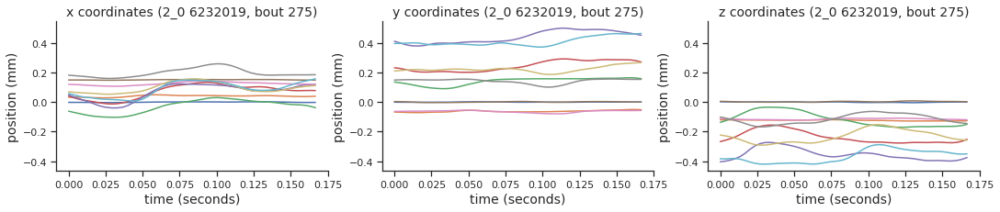

06232019_fly4_0 R2C2  str-cw-0.03 sec


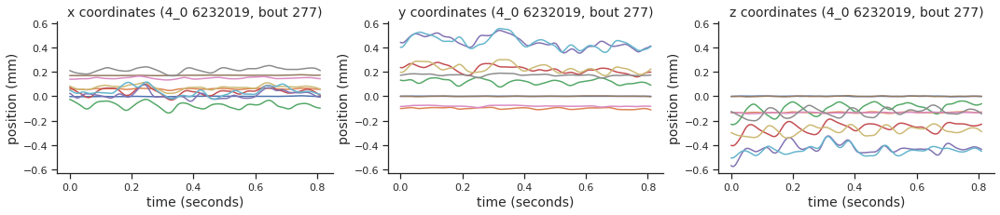

06232019_fly5_0 R1C7  str-cw-0.72 sec


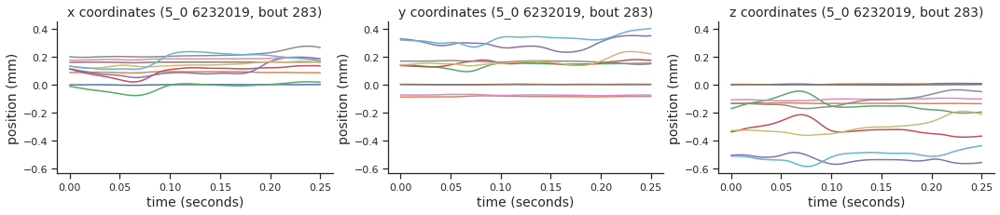

06232019_fly5_0 R2C5  str-cw-0.18 sec


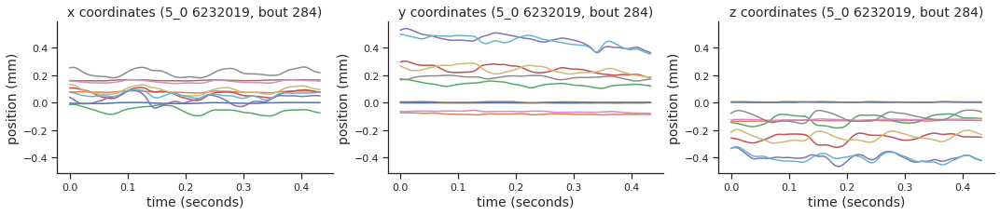

06232019_fly5_0 R2C13  str-ccw-0.36 sec


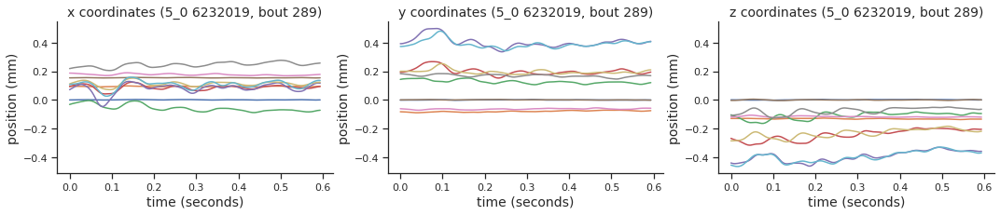

06232019_fly6_0 R1C23  rot-ccw-0.03 sec


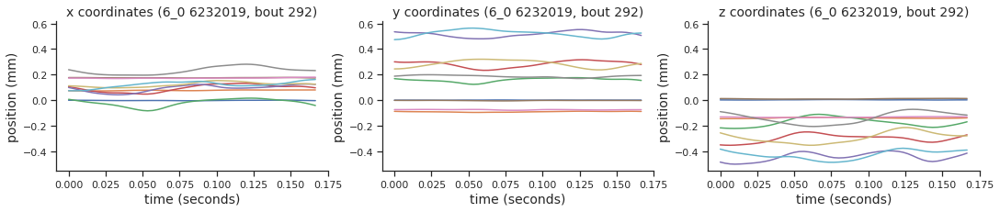

06232019_fly6_0 R2C16  rot-cw-0.03 sec


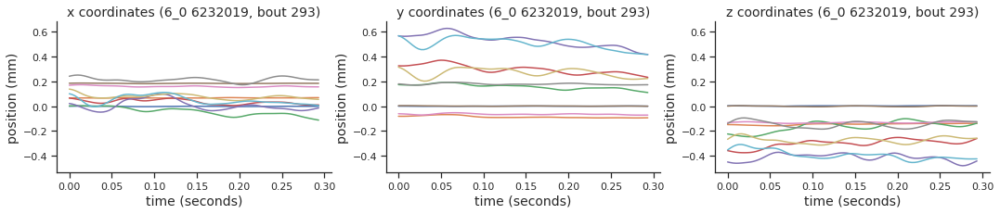

06242019_fly1_1 R1C1  str-cw-0 sec


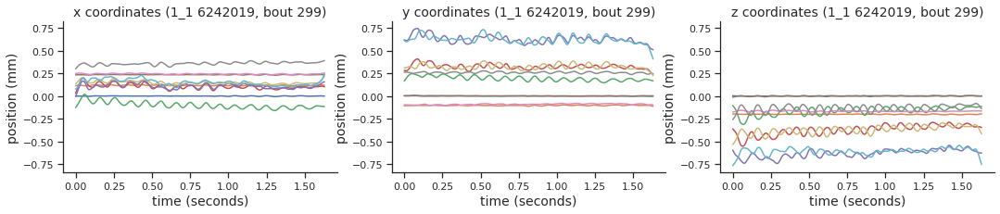

06242019_fly1_1 R2C24  rot-ccw-0.06 sec


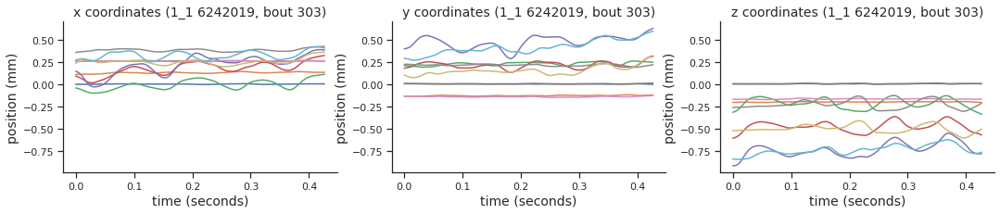

06242019_fly1_1 R3C7  str-cw-0.72 sec


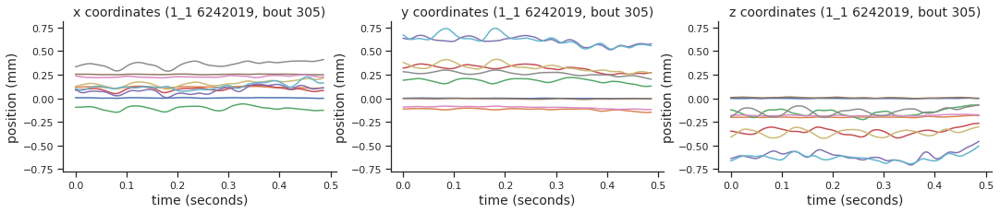

06242019_fly1_1 R3C13  str-ccw-0.36 sec


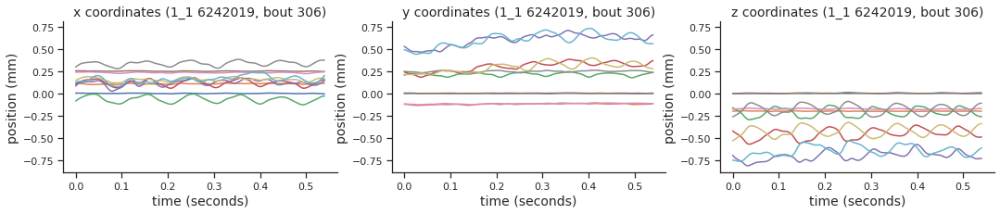

06242019_fly2_1 R2C10  str-ccw-0.06 sec


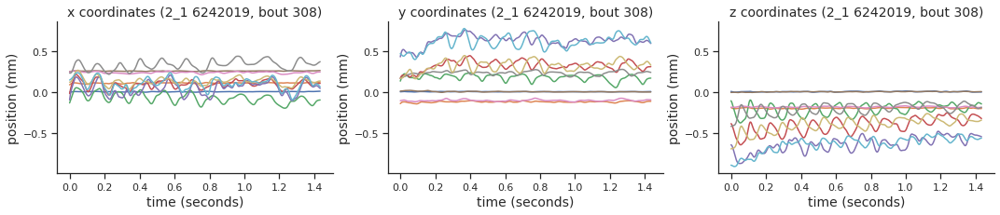

06242019_fly5_0 R1C9  str-ccw-0.03 sec


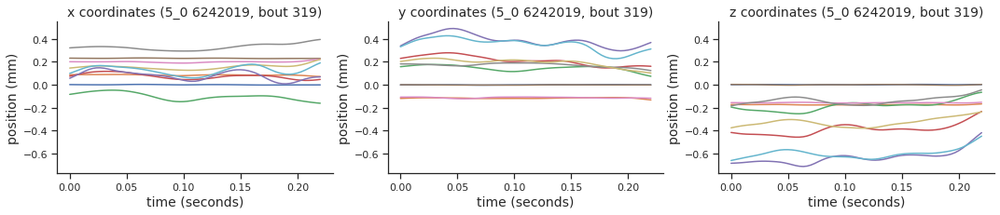

06242019_fly6_0 R2C8  str-ccw-0 sec


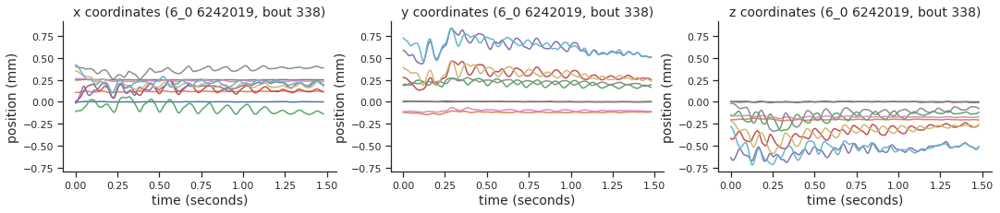

06242019_fly6_0 R2C23  rot-ccw-0.03 sec


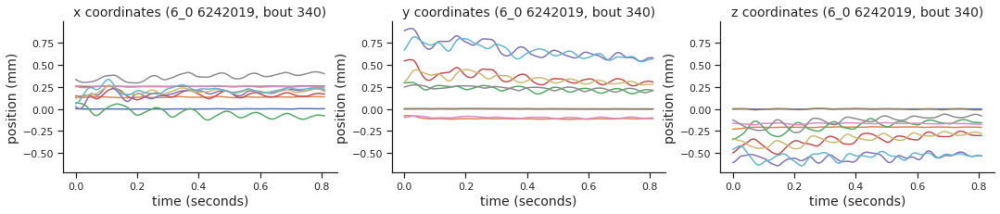

06242019_fly7_0 R1C15  rot-cw-0 sec


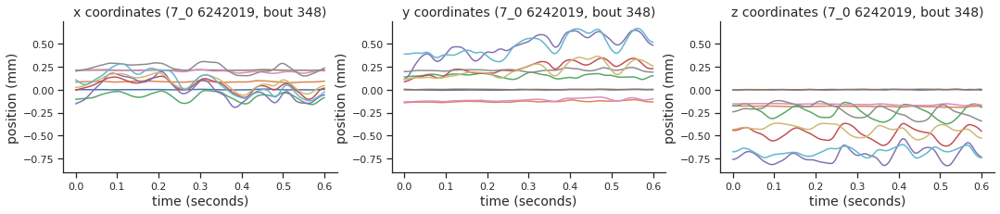

06242019_fly7_0 R1C15  rot-cw-0 sec


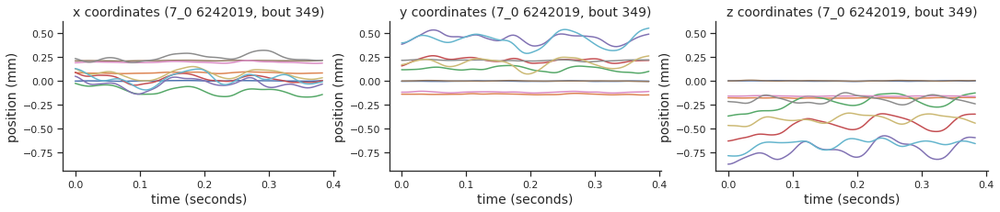

06242019_fly7_0 R1C21  rot-cw-0.72 sec


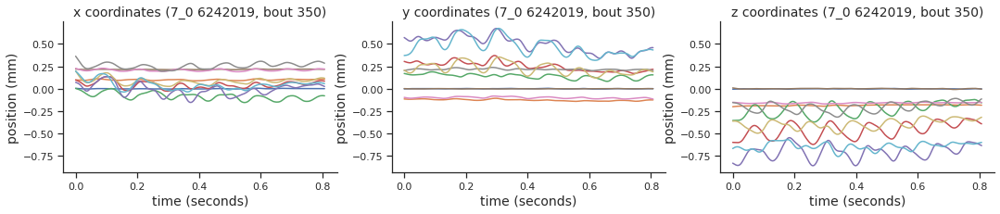

06242019_fly7_0 R1C21  rot-cw-0.72 sec


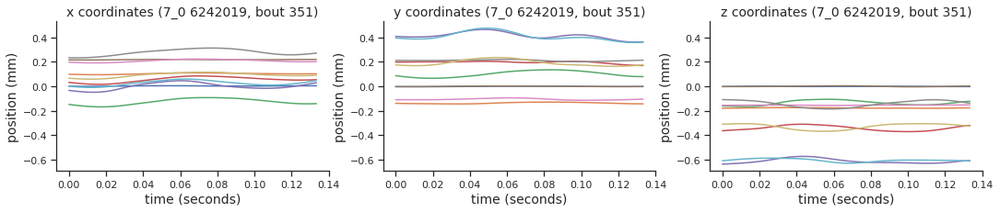

06242019_fly7_0 R1C23  rot-ccw-0.03 sec


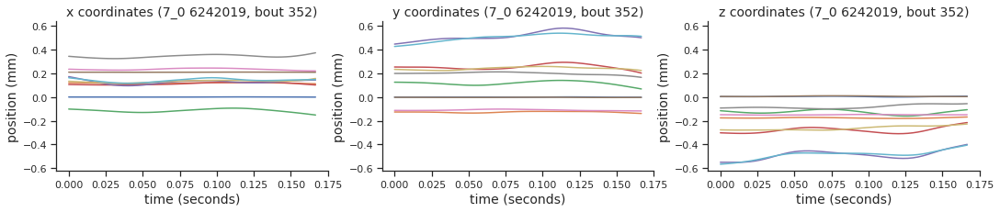

06242019_fly8_0 R1C3  str-cw-0.06 sec


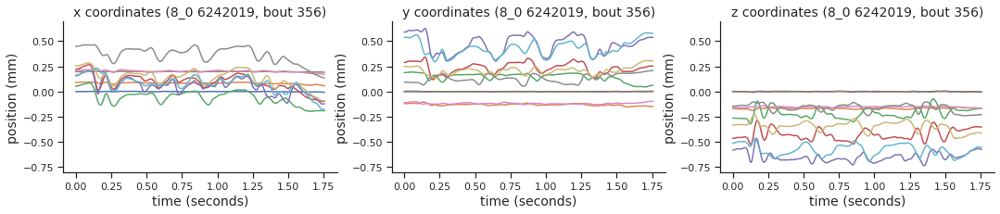

06242019_fly8_0 R1C23  rot-ccw-0.03 sec


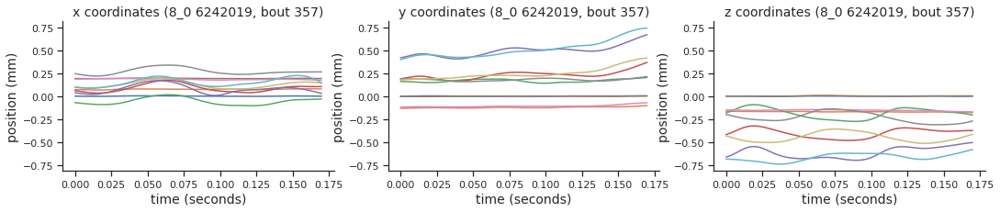

06242019_fly8_0 R2C9  str-ccw-0.03 sec


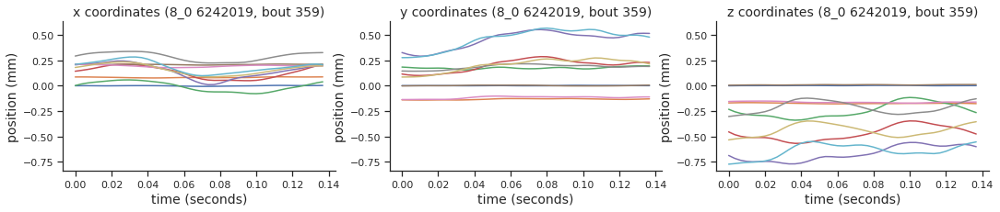

06242019_fly8_0 R2C28  rot-ccw-0.72 sec


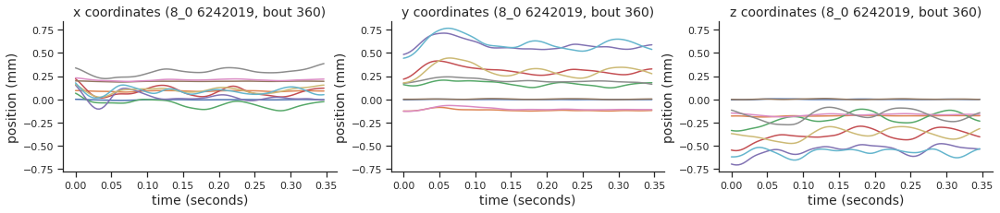

06242019_fly8_0 R3C1  str-cw-0 sec


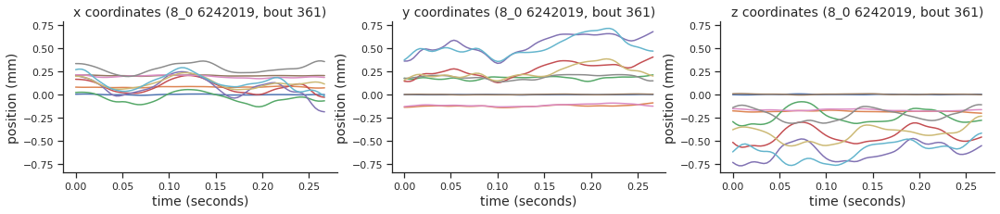

06252019_fly3_0 R2C8  str-ccw-0 sec


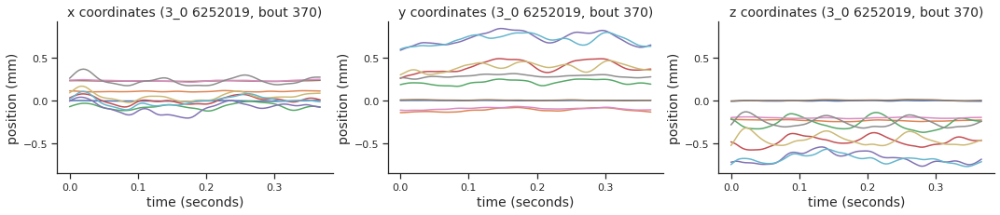

06252019_fly4_0 R2C2  str-cw-0.03 sec


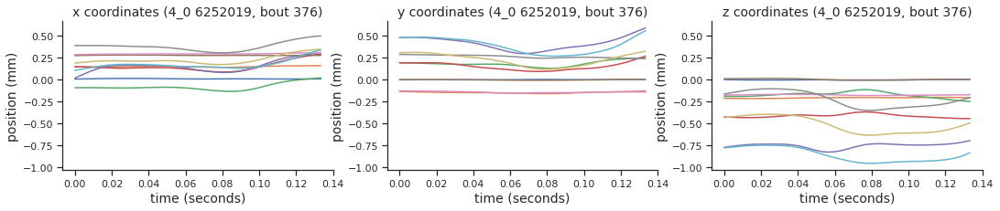

06252019_fly4_0 R2C2  str-cw-0.03 sec


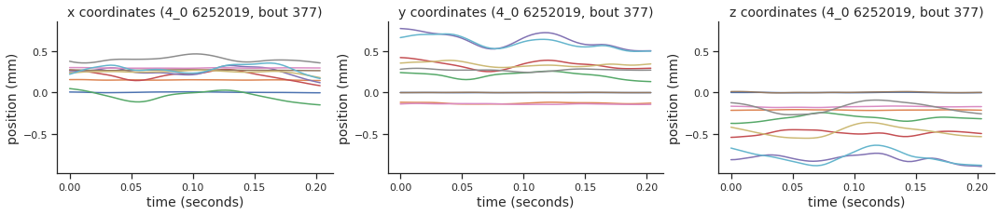

06252019_fly4_0 R2C25  rot-ccw-0.09 sec


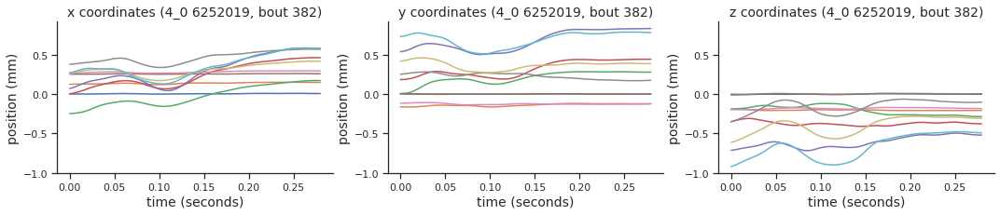

06252019_fly4_0 R3C24  rot-ccw-0.06 sec


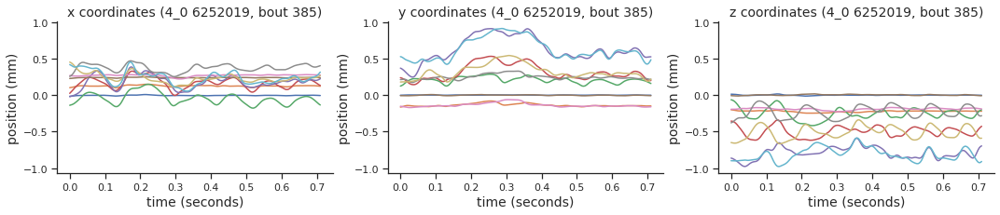

06252019_fly8_0 R1C13  str-ccw-0.36 sec


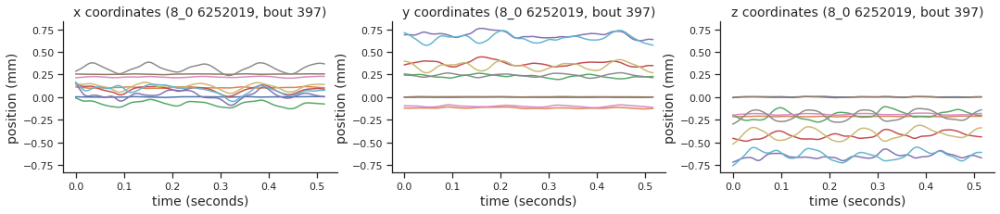

06252019_fly8_0 R3C24  rot-ccw-0.06 sec


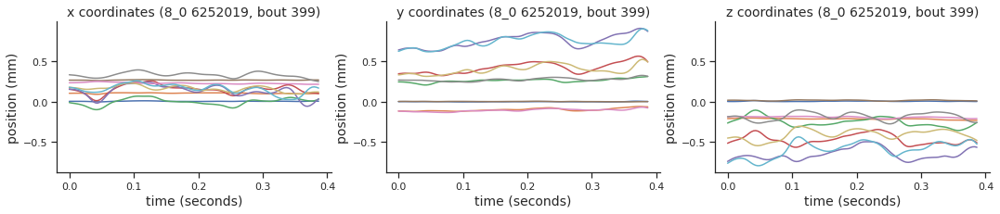

06252019_fly9_0 R2C16  rot-cw-0.03 sec


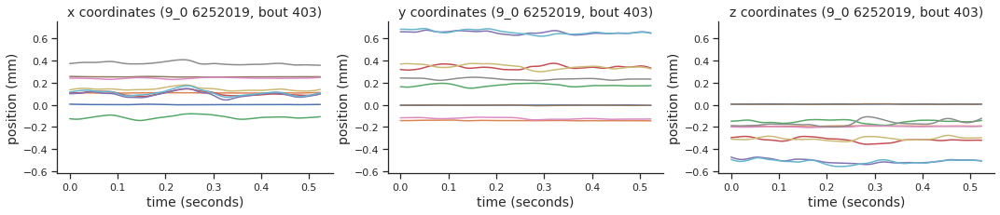

06252019_fly9_0 R2C26  rot-ccw-0.18 sec


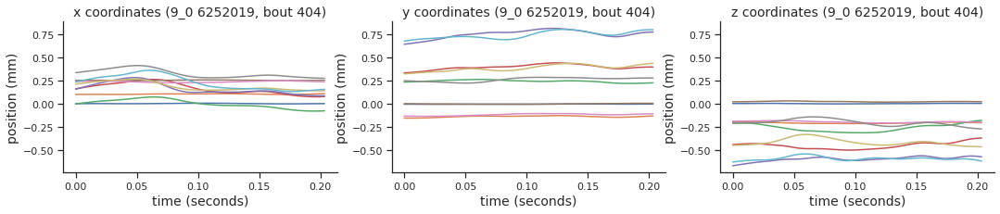

06252019_fly9_0 R2C26  rot-ccw-0.18 sec


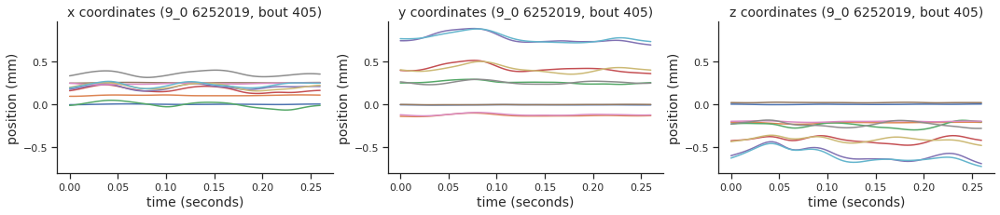

06262019_fly1_2 R2C6  str-cw-0.36 sec


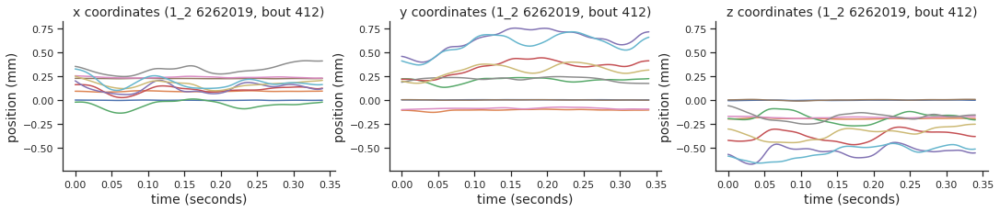

06262019_fly1_2 R2C22  rot-ccw-0 sec


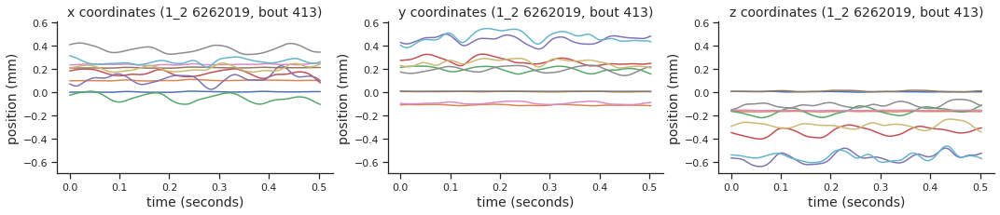

06262019_fly1_2 R3C19  rot-cw-0.18 sec


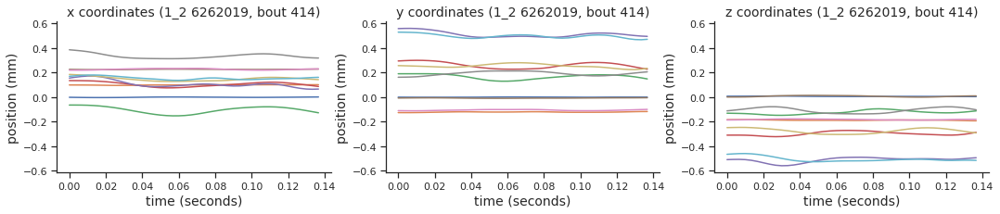

06262019_fly2_0 R3C12  str-ccw-0.18 sec


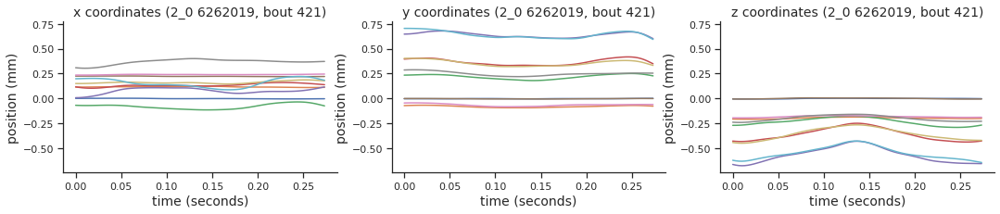

06262019_fly2_0 R3C18  rot-cw-0.09 sec


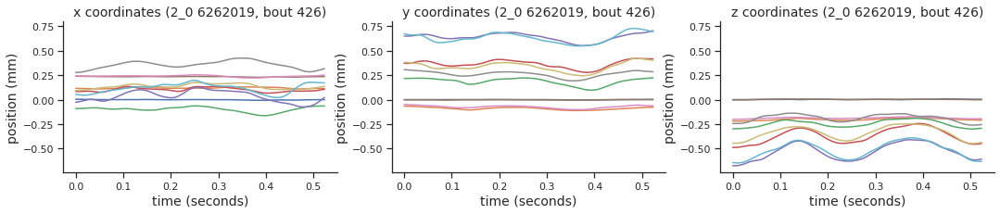

06262019_fly2_0 R3C19  rot-cw-0.18 sec


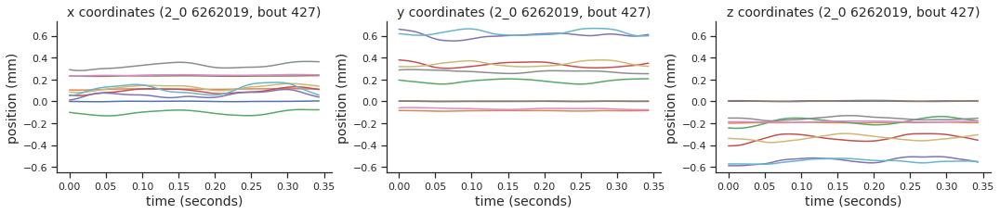

06262019_fly3_0 R1C27  rot-ccw-0.36 sec


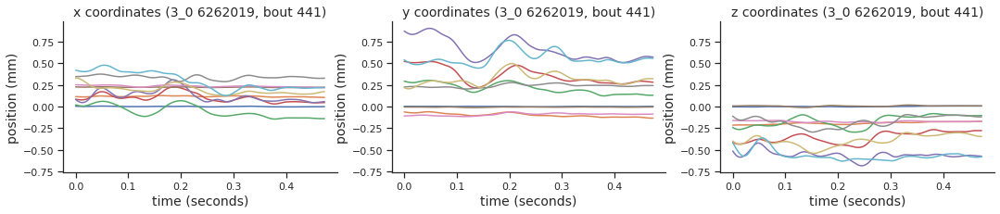

06262019_fly3_0 R2C26  rot-ccw-0.18 sec


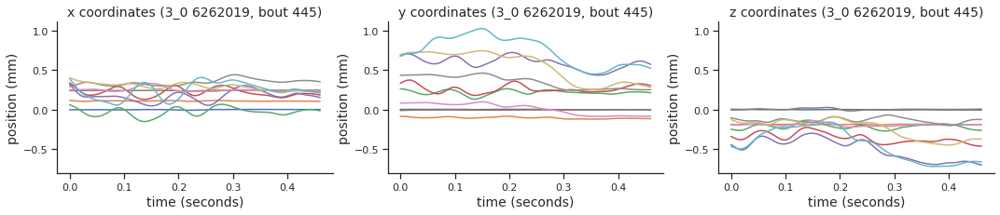

06262019_fly5_0 R2C9  str-ccw-0.03 sec


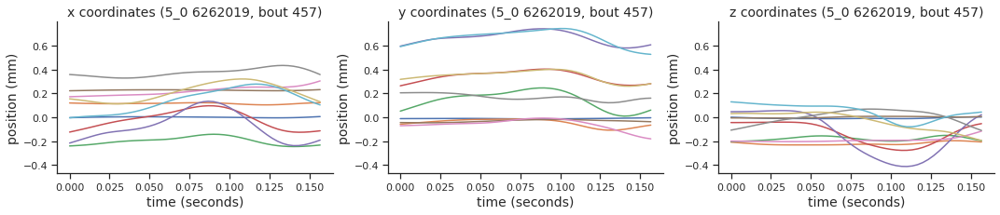

06262019_fly6_0 R2C15  rot-cw-0 sec


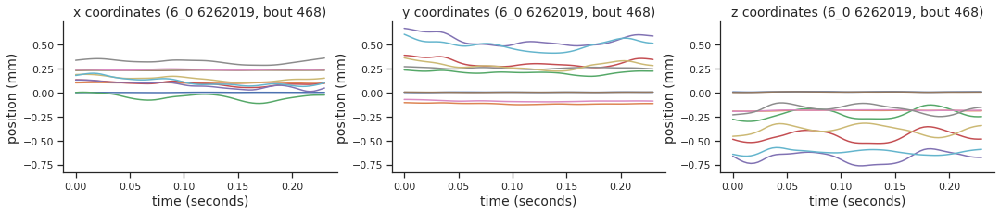

06262019_fly7_0 R2C9  str-ccw-0.03 sec


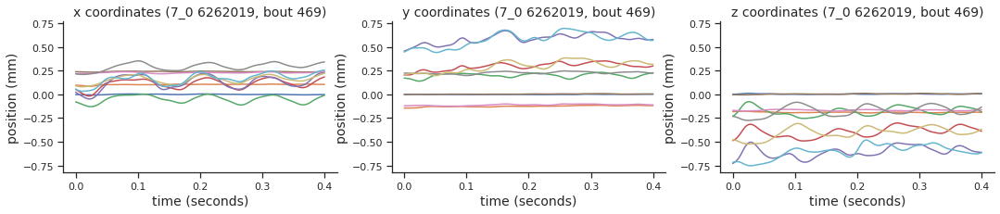

07022019_fly2_0 R3C22  rot-ccw-0 sec


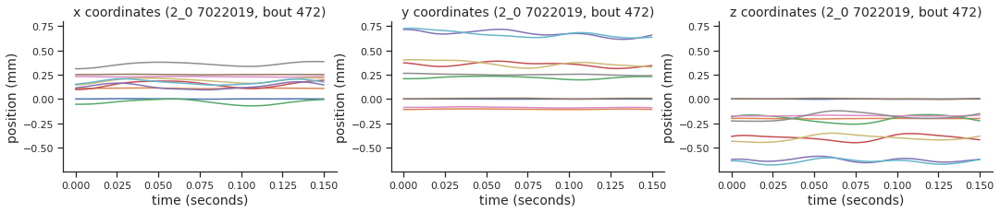

07022019_fly4_0 R2C20  rot-cw-0.36 sec


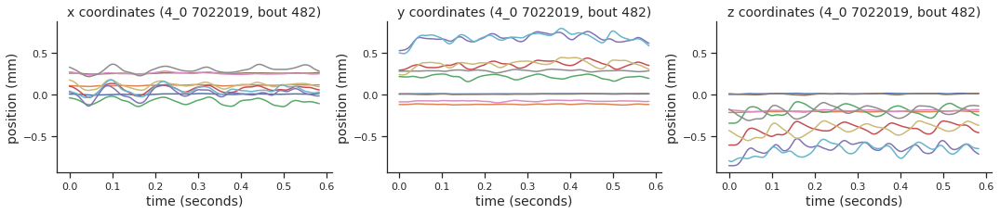

07102019_fly4_0 R2C27  rot-ccw-0.36 sec


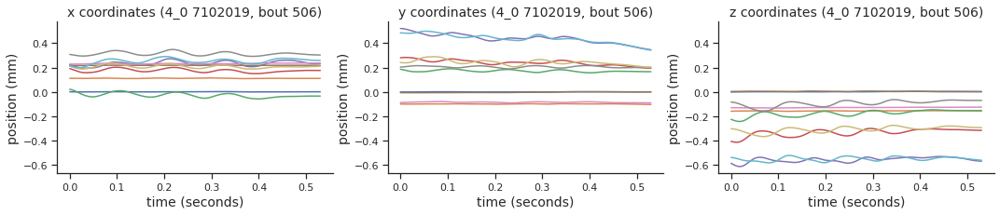

07182019_fly2_0 R2C13  str-ccw-0.36 sec


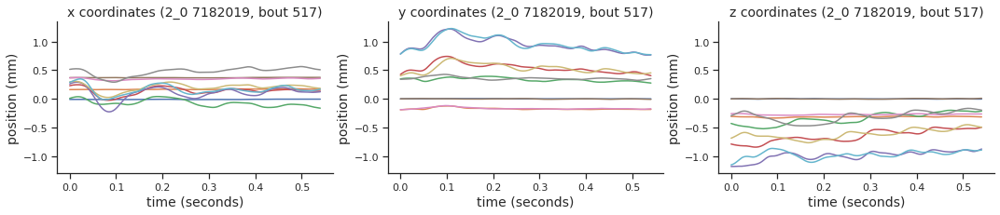

07232019_fly1_0 R2C13  str-ccw-0.36 sec


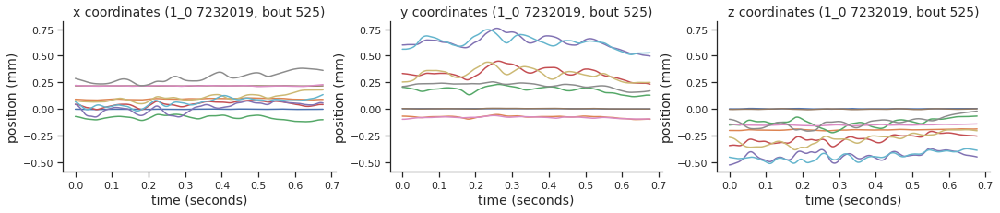

07232019_fly4_0 R2C20  rot-cw-0.36 sec


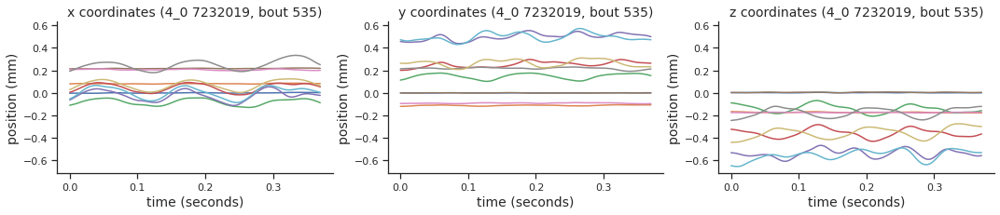

07242019_fly1_0 R1C3  str-cw-0.06 sec


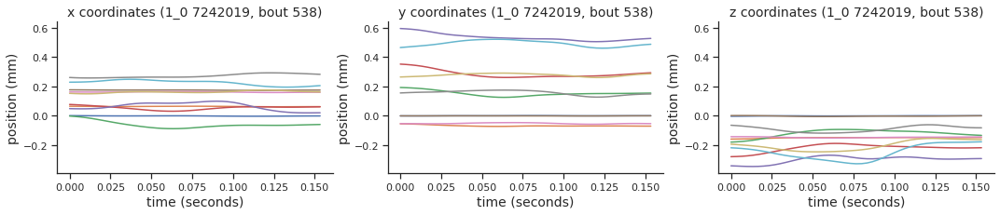

07242019_fly4_0 R2C25  rot-ccw-0.09 sec


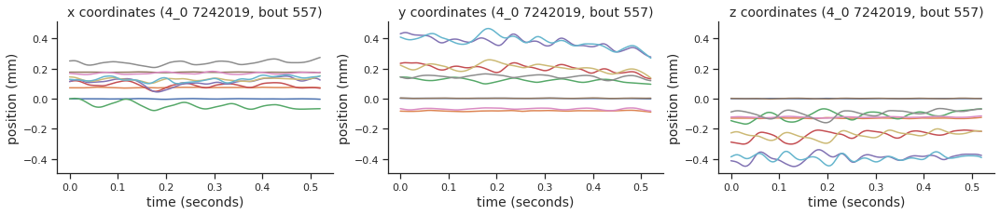

10072019_fly1_0 R1C6  str-cw-0.36 sec


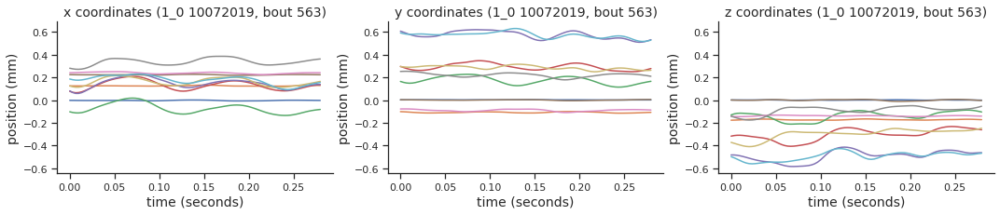

10072019_fly1_0 R3C5  str-cw-0.18 sec


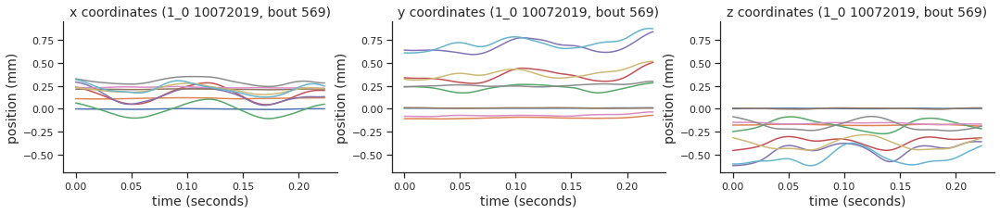

10072019_fly1_0 R3C22  rot-ccw-0 sec


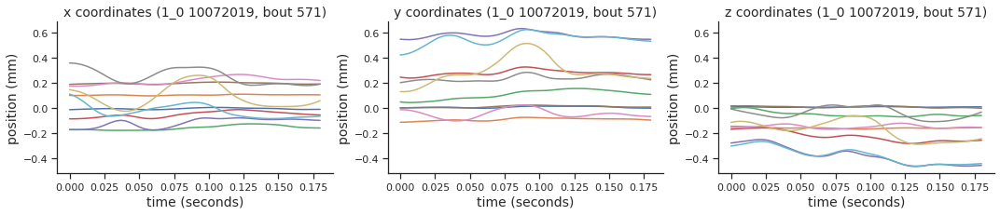

10072019_fly2_0 R2C18  rot-cw-0.09 sec


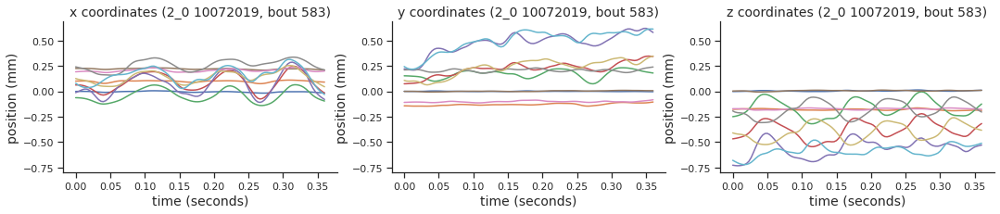

10072019_fly2_0 R2C21  rot-cw-0.72 sec


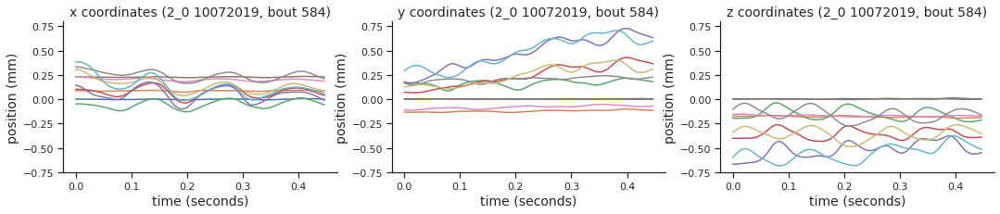

10072019_fly3_0 R3C6  str-cw-0.36 sec


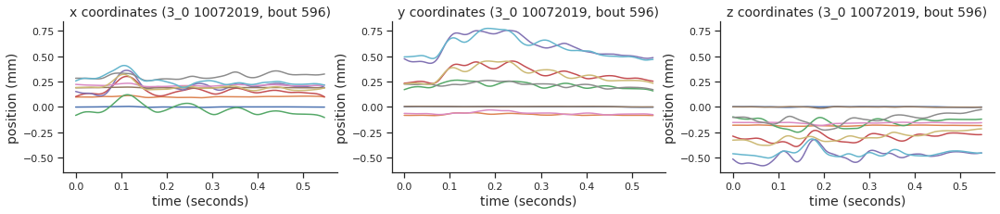

10072019_fly5_0 R1C6  str-cw-0.36 sec


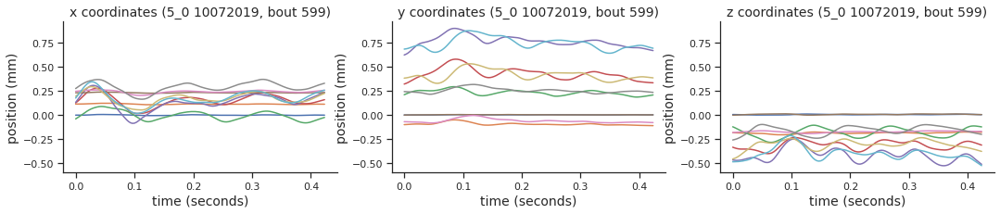

10072019_fly5_0 R1C23  rot-ccw-0.03 sec


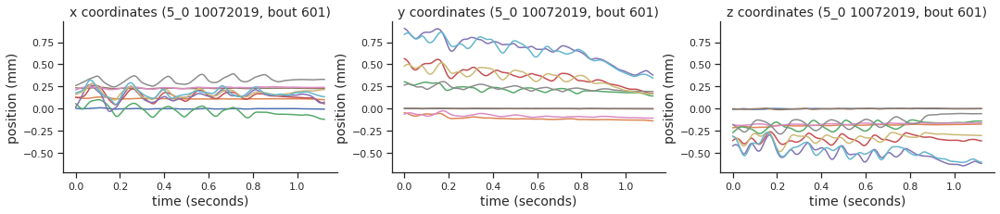

In [6]:
# plot all t1 grooming coords across time (subplots) 
legs = ['L1', 'R1']
coords = ['_x', '_y', '_z']
bout_numbers = np.unique(data.behavior_bout.astype(int))

for k in range(len(bout_numbers)):

    bout = data[data.behavior_bout == bout_numbers[k]]
    fig, axs = plt.subplots(1, 3, sharex=True, sharey=True, figsize = (18, 3))
    ax = axs.T.flatten()
    print(bout.filename.iloc[0])      
    handles = []
    labels = []
    
    for i in range(len(coords)): 

        coord_vars = [v for v in data.columns if some_contains(v, [coords[i]])
                     and not some_contains(v, ['_d1', '_d2', '_freq', '_range'])
                     and v[:2] in legs]

        for j in range(len(coord_vars)):
            
            angle = np.array(bout.iloc[0:][coord_vars[j]])
            t = np.array(range(len(angle))) / fps
            ax[i].plot(t, angle, label = coord_vars[j])
            ax[i].set_xlabel('time (seconds)', fontsize = 14)
            ax[i].set_ylabel('position (mm)', fontsize = 14)
            ax[i].set_title('{} coordinates ({}, bout {})'.format(coords[i][1], bout.flyid.iloc[0] , str(int(bout_numbers[k]))), fontsize = 14)
            ax[i].tick_params(labelleft = True)
            
        hs, ls = ax[i].get_legend_handles_labels()
        handles.append(hs)
        labels.append(hs)     
            
    sns.despine()
    plt.show() 

In [14]:
# add velocity and acceleration columns to data
angle_vars = [v for v in data.columns
              if some_contains(v, ['_flex', '_rot'])
              and not some_contains(v, ['_d1', '_d2', '_freq', '_range'])]

dt = 1/fps
s = 1.0/dt
s2 = 1.0 / (dt * dt)

bout_numbers = np.unique(data.behavior_bout)
for j in range(len(bout_numbers)):
    mask = data.behavior_bout == bout_numbers[j]
    bout_df = data.loc[mask]
    for ang in angle_vars:
        bout = np.array(bout_df[ang])
        data.loc[mask, ang + '_d1'] = signal.savgol_filter(bout, 5, 3, deriv=1) * s
        data.loc[mask, ang + '_d2'] = signal.savgol_filter(bout, 5, 3, deriv=2) * s2

In [ ]:
# plot 3d joint trajectories for a bout
align_to = 'C_flex_d1'
legs = ['L1', 'R1']
joints = ['A', 'B', 'C', 'D', 'E']
# bout_num = bout_numbers[10] 15 16 20* 24 27** 39 (lr) 125 
bout_num = bout_numbers[10]
bout_data = data[data.behavior_bout == bout_num]
print(bout_data.filename.iloc[0])
plot_direction(data, align_to, legs, joints, title_extension = ' (bout {})'.format(str(bout_num)), legend = False)


05222019_fly3_0 R3C5  str-cw-0.18 sec


['L1A_flex_d1',
 'L1B_flex_d1',
 'L1C_flex_d1',
 'L1D_flex_d1',
 'R1A_flex_d1',
 'R1B_flex_d1',
 'R1C_flex_d1',
 'R1D_flex_d1',
 'L1A_rot_d1',
 'L1B_rot_d1',
 'L1C_rot_d1',
 'R1A_rot_d1',
 'R1B_rot_d1',
 'R1C_rot_d1']

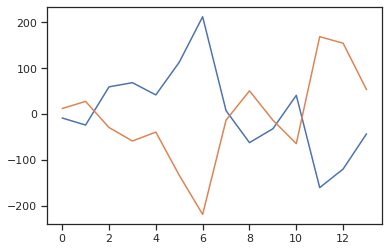

In [30]:
# plot a single joint trajectory in 3d from a bout
align_to = 'C_flex_d1'
legs = ['L1']
joints = ['C']
bout_num = bout_numbers[15]
bout_data = data[data.behavior_bout == bout_num]
print(bout_data.filename.iloc[0])
# plot_direction(data, align_to, legs, joints, title_extension = 'of ' + legs[0] + joints[0] + ' (bout {})'.format(str(bout_num)), legend = False)

angs = [v for v in data.columns if some_contains(v, ['_flex_d1', '_rot_d1']) and some_contains(v, ['L1', 'R1'])]
forward, backward = get_direction(bout_data, 'R1' + align_to)
forward = bout_data[forward]
backward = bout_data[backward]
f = np.array(forward[angs].mean())
b = np.array(backward[angs].mean())
plt.plot(range(len(f)), f)
plt.plot(range(len(b)), b)
angs

In [ ]:
# plot 3d trajectories for all bouts
align_to = 'C_flex_d1'
legs = ['L1', 'R1']
joints = ['A', 'B', 'C', 'D', 'E']
bout_numbers = np.unique(data.behavior_bout)

for j in range(len(bout_numbers)):
    bout_data = data[data.behavior_bout == bout_numbers[j]]
    plot_direction(bout_data, align_to, legs, joints, title_extension = ' (bout {})'.format(bout_numbers[j]))